<a href="https://colab.research.google.com/github/salvo96/Variational-Autoencoders-for-Inverse-Molecular-Design/blob/main/VAE(QM7).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Variational Autoencoder architecture from $keras.io$

Let's try to create a Variational Autoencoder according to the model proposed here: https://keras.io/examples/generative/vae/ 

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))  #trick
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon 

In [ ]:
def encoder(dim1, dim2, dim3, latent_dim):
  encoder_inputs = keras.Input(shape=(dim1, dim2, dim3))   #e.g.(23, 28, 1)
  x = layers.Conv2D(16, 3, activation="relu", strides=1, padding="same")(encoder_inputs)  #initially 32 filters
  x = layers.Conv2D(32, 3, activation="relu", strides=1, padding="same")(x)               #initially 64 filters
  x = layers.Flatten()(x)
  x = layers.Dense(16, activation="relu")(x)
  z_mean = layers.Dense(latent_dim, name="z_mean")(x)
  z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
  z = Sampling()([z_mean, z_log_var])
  encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
  encoder.summary()
  return encoder

In [ ]:
def decoder(dim1, dim2, latent_dim):
  latent_inputs = keras.Input(shape=(latent_dim,))
  x = layers.Dense(dim1 * dim2 * 64, activation="relu")(latent_inputs)
  x = layers.Reshape((dim1, dim2, 64))(x)
  x = layers.Conv2DTranspose(32, 3, activation="relu", strides=1, padding="same")(x)  #initially 64 filters
  x = layers.Conv2DTranspose(16, 3, activation="relu", strides=1, padding="same")(x)  #initially 32 filters
  decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
  decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
  decoder.summary()
  return decoder

In [ ]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(name="reconstruction_loss")
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")
        self.features_reconstruction_loss_tracker = keras.metrics.Mean(name="features_reconstruction_loss")

    @property
    def metrics(self):  #metrics is an attribute of VAE
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(tf.reduce_sum(keras.losses.mean_squared_error(data, reconstruction), axis=(1, 2)))
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights) #computation of the derivatives of the loss with respect to weights => gradients
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))  #application of the computed gradients
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

    #here we put the function to implement the evaluation of the model
    def validate(self, data): 
      _, _, z = self.encoder(data)
      reconstruction = self.decoder(z)
      reconstruction_loss = tf.reduce_sum(tf.math.square(data - reconstruction), 0) / data.shape[0]
      return tf.squeeze(reconstruction_loss)
      
      



Now let's try to train our VAE on our QM7 and QM7b datasets

In [ ]:
import scipy.io as sio
import numpy as np
from io import StringIO

In [ ]:
#To execute on Colab
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


Here we load the qm7 dataset:

In [ ]:
#To execute on Colab
path = '/content/drive/MyDrive/Thesis Research/qm7.mat'

In [ ]:
#To execute on Local Environment
#path = 'C:\\Users\\salva\\qm7.mat'

In [ ]:
qm7 = sio.loadmat(path)

Here we load the qm7b dataset:

In [ ]:
#To execute on Colab
path_b = '/content/drive/MyDrive/Thesis Research/qm7b.mat'

In [ ]:
#To execute on Local Environment
#path_b = 'C:\\Users\\salva\\qm7b.mat'

In [ ]:
qm7b = sio.loadmat(path_b)

Now let's try to build the two complete datasets derived from the aggregation of elements in qm7 and qm7b:

In [ ]:
data_a_unnorm =  np.concatenate ((qm7['X'], np.expand_dims(qm7['Z'], 2), qm7['R'], np.tile(qm7['T'].T, (23)).reshape(7165,23,1)), axis=2)

In [ ]:
data_b_unnorm =  np.concatenate ((qm7b['X'], np.tile(qm7b['T'], (23)).reshape(7211,23,14)), axis=2)

Here we add one more dimension to dataset *data_a* to be suitable for our VAE

In [ ]:
data_a_unnorm = np.expand_dims(data_a_unnorm, -1)

Here we do the same with *data_b*

In [ ]:
data_b_unnorm = np.expand_dims(data_b_unnorm, -1)

Then we normalize our datasets as a preprocessing phase before training:

In [ ]:
data_a = (data_a_unnorm - data_a_unnorm.min(axis=0)) / (data_a_unnorm.max(axis=0) - data_a_unnorm.min(axis=0))

data_b = (data_b_unnorm - data_b_unnorm.min(axis=0)) / (data_b_unnorm.max(axis=0) - data_b_unnorm.min(axis=0))

Before using our datasets to train our model we need to shuffle it in order to reduce the consequences of some hidden patterns (e.g. data ordered according to a certain criteria)

In [ ]:
#np.random.shuffle(data_a)
#np.random.shuffle(data_b)

Finally let's determine our latent dimension variable:

In [ ]:
latent_dim = 2

###Dataset qm7

Let's try to split our dataset into *training* and *validation* subsets, according to a *80%/20%* schema:

In [ ]:
molecule_qty = data_a.shape[0]
data_a_train = data_a[0:round(molecule_qty*0.8)]
data_a_validation = data_a[round(molecule_qty*0.8):molecule_qty]

Then we instantiate *encoder_a* and *decoder_a*:

In [ ]:
encoder_a = encoder(23, 28, 1, latent_dim)
decoder_a = decoder(23, 28, latent_dim)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 23, 28, 1)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 23, 28, 16)   160         ['input_1[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 23, 28, 32)   4640        ['conv2d[0][0]']                 
                                                                                                  
 flatten (Flatten)              (None, 20608)        0           ['conv2d_1[0][0]']               
                                                                                            

Here we train our model with *data_a_train* dataset:

In [ ]:
vae_a = VAE(encoder_a, decoder_a)
vae_a.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))

In [ ]:
#To load the model from .h5 file without training
vae_a.built = True
vae_a.load_weights("/content/drive/MyDrive/Thesis Research/vae_a_trained.h5")

In [ ]:
#To train the model
hist = vae_a.fit(data_a_train, epochs=70, batch_size=128)

Epoch 1/70
45/45 [==============================] - 12s 16ms/step - loss: 67.6404 - reconstruction_loss: 46.5265 - kl_loss: 1.0184
Epoch 2/70
45/45 [==============================] - 1s 13ms/step - loss: 24.1519 - reconstruction_loss: 21.5860 - kl_loss: 1.2725
Epoch 3/70
45/45 [==============================] - 1s 15ms/step - loss: 21.0208 - reconstruction_loss: 19.0829 - kl_loss: 1.5072
Epoch 4/70
45/45 [==============================] - 1s 15ms/step - loss: 19.8276 - reconstruction_loss: 18.0581 - kl_loss: 1.7038
Epoch 5/70
45/45 [==============================] - 1s 16ms/step - loss: 18.9531 - reconstruction_loss: 17.0661 - kl_loss: 1.7904
Epoch 6/70
45/45 [==============================] - 1s 16ms/step - loss: 18.2233 - reconstruction_loss: 16.1973 - kl_loss: 1.9346
Epoch 7/70
45/45 [==============================] - 1s 18ms/step - loss: 17.6486 - reconstruction_loss: 15.4849 - kl_loss: 2.0777
Epoch 8/70
45/45 [==============================] - 1s 17ms/step - loss: 17.1362 - recons

In [ ]:
from matplotlib import pyplot as plt

def plotTrainLoss(history, title, filename):
  plt.plot(history.history['loss'])
  plt.plot(history.history['reconstruction_loss'])
  plt.plot(history.history['kl_loss'])
  plt.title(title)
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['total', 'reconstruction', 'kl'], loc='upper right')
  plt.savefig(filename)
  plt.show()
  


In [ ]:
plotTrainLoss(hist, "VAE Training Loss - QM7 Dataset", "qm7-train-loss.png")

We save a copy of the model to avoid retraining:

In [ ]:
vae_a.save_weights('/content/drive/MyDrive/Thesis Research/vae_a_trained.h5', overwrite=True, save_format=None, options=None)

Here we compute the *reconstruction loss* (MSE) of the features comparing the real dataset (validation part) and the generated one:

In [ ]:
reconstruction_loss_matrix_a = vae_a.validate(data_a_validation)

Where is the highest reconstruction error? Let's see it using a heatmap:

In [ ]:
import seaborn as sns;

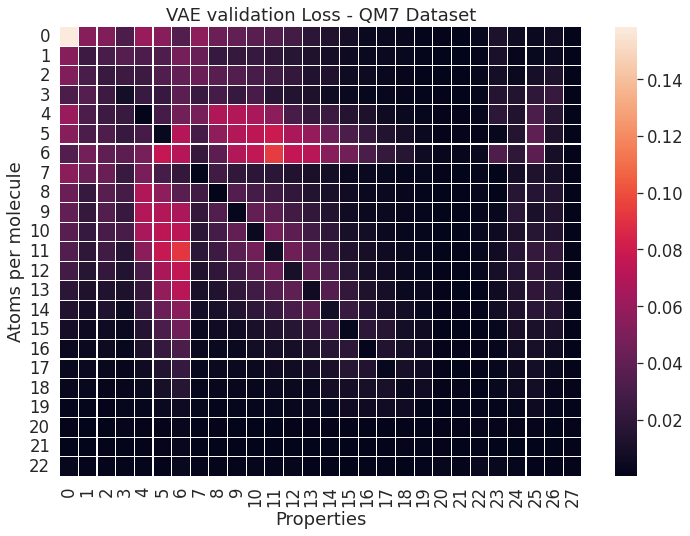

In [ ]:
sns.set_theme()
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set(font_scale=1.5)

ax = sns.heatmap(reconstruction_loss_matrix_a, linewidths=.1)
ax.set(xlabel='Properties', ylabel='Atoms per molecule')
ax.set(title='VAE validation Loss - QM7 Dataset')
ax.figure.savefig("qm7-val-loss.png")

###Dataset qm7b

Let's define a more complex version of the model:

In [ ]:
def encoder_b(dim1, dim2, dim3, latent_dim):
  encoder_inputs = keras.Input(shape=(dim1, dim2, dim3))   #e.g.(23, 28, 1)
  x = layers.Conv2D(16, 3, activation="relu", strides=1, padding="same")(encoder_inputs)  #added this layer wrt the initial keras.io architecture
  x = layers.Conv2D(32, 3, activation="relu", strides=1, padding="same")(x)
  x = layers.Conv2D(64, 3, activation="relu", strides=1, padding="same")(x)
  x = layers.Flatten()(x)
  x = layers.Dense(16, activation="relu")(x)
  z_mean = layers.Dense(latent_dim, name="z_mean")(x)
  z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
  z = Sampling()([z_mean, z_log_var])
  encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
  encoder.summary()
  return encoder

In [ ]:
def decoder_b(dim1, dim2, latent_dim):
  latent_inputs = keras.Input(shape=(latent_dim,))
  x = layers.Dense(dim1 * dim2 * 64, activation="relu")(latent_inputs)
  x = layers.Reshape((dim1, dim2, 64))(x)
  x = layers.Conv2DTranspose(64, 3, activation="relu", strides=1, padding="same")(x)
  x = layers.Conv2DTranspose(32, 3, activation="relu", strides=1, padding="same")(x)
  x = layers.Conv2DTranspose(16, 3, activation="relu", strides=1, padding="same")(x)  #added this layer wrt the initial keras.io architecture
  decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
  decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
  decoder.summary()
  return decoder

In [ ]:
class VAEb(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAEb, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(name="reconstruction_loss")
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")
        self.features_reconstruction_loss_tracker = keras.metrics.Mean(name="features_reconstruction_loss")

    @property
    def metrics(self):  #metrics is an attribute of VAE
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(tf.reduce_sum(keras.losses.mean_squared_error(data, reconstruction), axis=(1, 2)))
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + 1/37*kl_loss #added 1/37 term => less importance to Kullback-Leibler divergence, more to reconstruction loss
        grads = tape.gradient(total_loss, self.trainable_weights) #computation of the derivatives of the loss with respect to weights => gradients
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))  #application of the computed gradients
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

    #here we put the function to implement the evaluation of the model
    def validate(self, data): 
      _, _, z = self.encoder(data)
      reconstruction = self.decoder(z)
      reconstruction_loss = tf.reduce_sum(tf.math.square(data - reconstruction), 0) / data.shape[0]
      return tf.squeeze(reconstruction_loss)
      
      



Let's try to split our *dataset_b* into *training* and *validation* subsets, according to a *80%/20%* schema:

In [ ]:
molecule_qty = data_b.shape[0]
data_b_train = data_b[0:round(molecule_qty*0.8)]
data_b_validation = data_b[round(molecule_qty*0.8):molecule_qty]

Then we instantiate *encoder_b* and *decoder_b*:

In [ ]:
encoder_b = encoder_b(23, 37, 1, latent_dim)
decoder_b = decoder_b(23, 37, latent_dim)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 23, 37, 1)]  0           []                               
                                                                                                  
 conv2d_2 (Conv2D)              (None, 23, 37, 16)   160         ['input_3[0][0]']                
                                                                                                  
 conv2d_3 (Conv2D)              (None, 23, 37, 32)   4640        ['conv2d_2[0][0]']               
                                                                                                  
 conv2d_4 (Conv2D)              (None, 23, 37, 64)   18496       ['conv2d_3[0][0]']               
                                                                                            

Here we train our model with *data_b_train* dataset:

In [ ]:
vae_b = VAEb(encoder_b, decoder_b)
vae_b.compile(optimizer=keras.optimizers.Adam())

In [ ]:
#To load the model from .h5 file without training
vae_b.built = True
vae_b.load_weights("/content/drive/MyDrive/Thesis Research/vae_b_trained.h5")

In [ ]:
#To train the model
hist_b = vae_b.fit(data_b_train, epochs=70, batch_size=128)

Epoch 1/70
46/46 [==============================] - 3s 30ms/step - loss: 75.9744 - reconstruction_loss: 37.3323 - kl_loss: 154.4905
Epoch 2/70
46/46 [==============================] - 1s 27ms/step - loss: 11.7638 - reconstruction_loss: 10.7012 - kl_loss: 1.8674
Epoch 3/70
46/46 [==============================] - 1s 26ms/step - loss: 9.4151 - reconstruction_loss: 9.2788 - kl_loss: 2.0335
Epoch 4/70
46/46 [==============================] - 1s 26ms/step - loss: 9.1960 - reconstruction_loss: 9.1371 - kl_loss: 1.8680
Epoch 5/70
46/46 [==============================] - 1s 26ms/step - loss: 9.0031 - reconstruction_loss: 8.8242 - kl_loss: 1.6434
Epoch 6/70
46/46 [==============================] - 1s 26ms/step - loss: 8.5500 - reconstruction_loss: 8.2464 - kl_loss: 1.6100
Epoch 7/70
46/46 [==============================] - 1s 26ms/step - loss: 7.6261 - reconstruction_loss: 7.4335 - kl_loss: 3.0234
Epoch 8/70
46/46 [==============================] - 1s 26ms/step - loss: 6.6676 - reconstruction_l

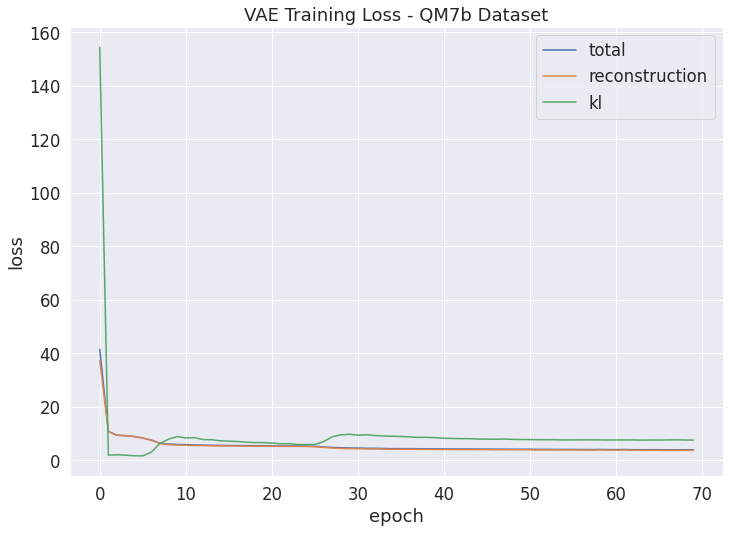

In [ ]:
plotTrainLoss(hist_b, "VAE Training Loss - QM7b Dataset", "qm7b-train-loss.png")

We save a copy of the model to avoid retraining:

In [ ]:
vae_b.save_weights('/content/drive/MyDrive/Thesis Research/vae_b_trained.h5', overwrite=True, save_format=None, options=None)

Here we compute the *reconstruction loss* (MSE) of the features comparing the real dataset (validation part) and the generated one:

In [ ]:
reconstruction_loss_matrix_b = vae_b.validate(data_b_validation)

Where is the highest reconstruction error? Let's see it using a heatmap:

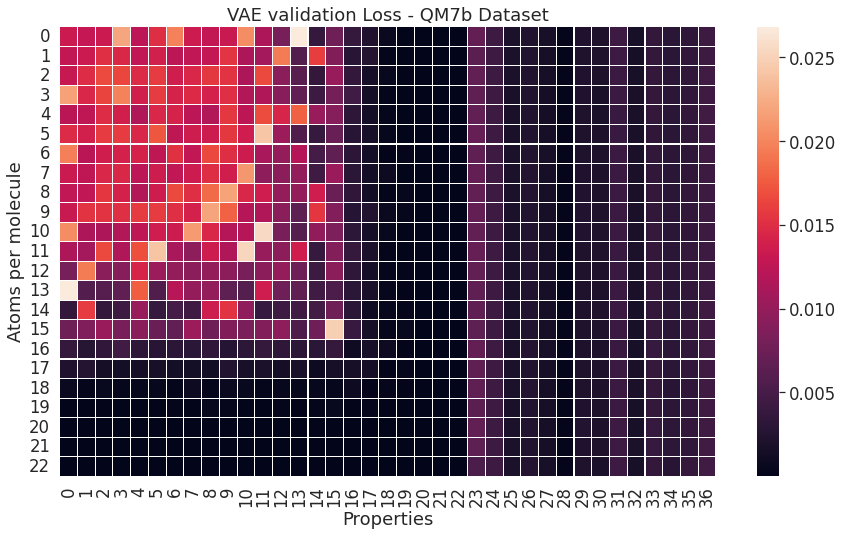

In [ ]:
sns.set_theme()
sns.set(rc={'figure.figsize':(14.7,8.27)})
sns.set(font_scale=1.5)

bx = sns.heatmap(reconstruction_loss_matrix_b, linewidths=.1)
bx.set(xlabel='Properties', ylabel='Atoms per molecule')
bx.set(title='VAE validation Loss - QM7b Dataset')
bx.figure.savefig("qm7b-val-loss.png")

Comparison between data stored into *qm7*/*qm7b* and *data_a*/*data_b* matrix (we consider the unnormalized version of *data_a* and *data_b*):

In [ ]:
import pandas as pd

In [ ]:
print(pd.DataFrame(np.squeeze(data_a_unnorm[2])))
print(pd.DataFrame(np.squeeze(data_b_unnorm[2])))


           0          1         2   ...        25   26          27
0   36.858105  14.261827  1.503703  ...  0.000189  0.0 -564.210022
1   14.261827  36.858105  2.925020  ... -0.000321 -0.0 -564.210022
2    1.503703   2.925020  0.500000  ...  1.757710  0.0 -564.210022
3    2.924997   1.503700  0.171786  ... -1.757162  0.0 -564.210022
4    2.924732   1.503680  0.215498  ...  1.757067 -0.0 -564.210022
5    1.503680   2.924700  0.284504  ... -1.757823  0.0 -564.210022
6    0.000000   0.000000  0.000000  ...  0.000000  0.0 -564.210022
7    0.000000   0.000000  0.000000  ...  0.000000  0.0 -564.210022
8    0.000000   0.000000  0.000000  ...  0.000000  0.0 -564.210022
9    0.000000   0.000000  0.000000  ...  0.000000  0.0 -564.210022
10   0.000000   0.000000  0.000000  ...  0.000000  0.0 -564.210022
11   0.000000   0.000000  0.000000  ...  0.000000  0.0 -564.210022
12   0.000000   0.000000  0.000000  ...  0.000000  0.0 -564.210022
13   0.000000   0.000000  0.000000  ...  0.000000  0.0 -564.21

In [ ]:
print(pd.DataFrame(qm7['X'][2]))
print(pd.DataFrame(qm7b['X'][2]))

           0          1         2         3         4   ...   18   19   20   21   22
0   36.858105  14.261827  1.503703  2.924997  2.924732  ...  0.0  0.0  0.0  0.0  0.0
1   14.261827  36.858105  2.925020  1.503700  1.503680  ...  0.0  0.0  0.0  0.0  0.0
2    1.503703   2.925020  0.500000  0.171786  0.215498  ...  0.0  0.0  0.0  0.0  0.0
3    2.924997   1.503700  0.171786  0.500000  0.284505  ...  0.0  0.0  0.0  0.0  0.0
4    2.924732   1.503680  0.215498  0.284505  0.500000  ...  0.0  0.0  0.0  0.0  0.0
5    1.503680   2.924700  0.284504  0.215499  0.171779  ...  0.0  0.0  0.0  0.0  0.0
6    0.000000   0.000000  0.000000  0.000000  0.000000  ...  0.0  0.0  0.0  0.0  0.0
7    0.000000   0.000000  0.000000  0.000000  0.000000  ...  0.0  0.0  0.0  0.0  0.0
8    0.000000   0.000000  0.000000  0.000000  0.000000  ...  0.0  0.0  0.0  0.0  0.0
9    0.000000   0.000000  0.000000  0.000000  0.000000  ...  0.0  0.0  0.0  0.0  0.0
10   0.000000   0.000000  0.000000  0.000000  0.000000  ...  0.0 

In [ ]:
print(pd.DataFrame(qm7['Z'][2]))

      0
0   6.0
1   6.0
2   1.0
3   1.0
4   1.0
5   1.0
6   0.0
7   0.0
8   0.0
9   0.0
10  0.0
11  0.0
12  0.0
13  0.0
14  0.0
15  0.0
16  0.0
17  0.0
18  0.0
19  0.0
20  0.0
21  0.0
22  0.0


In [ ]:
print(pd.DataFrame(qm7['R'][2]))

           0         1    2
0   1.869241  0.000189  0.0
1   4.393462 -0.000321 -0.0
2   0.811467  1.757710  0.0
3   0.810825 -1.757162  0.0
4   5.451860  1.757067 -0.0
5   5.451236 -1.757823  0.0
6   0.000000  0.000000  0.0
7   0.000000  0.000000  0.0
8   0.000000  0.000000  0.0
9   0.000000  0.000000  0.0
10  0.000000  0.000000  0.0
11  0.000000  0.000000  0.0
12  0.000000  0.000000  0.0
13  0.000000  0.000000  0.0
14  0.000000  0.000000  0.0
15  0.000000  0.000000  0.0
16  0.000000  0.000000  0.0
17  0.000000  0.000000  0.0
18  0.000000  0.000000  0.0
19  0.000000  0.000000  0.0
20  0.000000  0.000000  0.0
21  0.000000  0.000000  0.0
22  0.000000  0.000000  0.0


In [ ]:
print(pd.DataFrame(np.transpose(qm7['T'])[2]))
print(pd.DataFrame(qm7b['T'][2]))

            0
0 -564.210022
             0
0  -570.024841
1    22.940671
2     0.709060
3   -10.160000
4     1.231000
5     7.137266
6     9.752110
7    -0.820420
8    -7.876800
9    -0.062000
10  -10.438300
11    1.945600
12    4.173282
13    3.923080


In [ ]:
print(pd.DataFrame(np.squeeze(data_a_unnorm[3])))
print(pd.DataFrame(np.squeeze(data_b_unnorm[3])))

           0          1         2         3   ...        24   25   26          27
0   36.858105  15.871878  2.979434  1.401225  ...  1.880183  0.0  0.0 -404.880005
1   15.871878  36.858105  1.401225  2.979434  ...  4.148345  0.0  0.0 -404.880005
2    2.979434   1.401225  0.500000  0.158837  ... -0.133623  0.0  0.0 -404.880005
3    1.401225   2.979434  0.158837  0.500000  ...  6.162151  0.0  0.0 -404.880005
4    0.000000   0.000000  0.000000  0.000000  ...  0.000000  0.0  0.0 -404.880005
5    0.000000   0.000000  0.000000  0.000000  ...  0.000000  0.0  0.0 -404.880005
6    0.000000   0.000000  0.000000  0.000000  ...  0.000000  0.0  0.0 -404.880005
7    0.000000   0.000000  0.000000  0.000000  ...  0.000000  0.0  0.0 -404.880005
8    0.000000   0.000000  0.000000  0.000000  ...  0.000000  0.0  0.0 -404.880005
9    0.000000   0.000000  0.000000  0.000000  ...  0.000000  0.0  0.0 -404.880005
10   0.000000   0.000000  0.000000  0.000000  ...  0.000000  0.0  0.0 -404.880005
11   0.000000   

In [ ]:
print(pd.DataFrame(qm7['X'][3]))
print(pd.DataFrame(qm7b['X'][3]))

           0          1         2         3    4   ...   18   19   20   21   22
0   36.858105  15.871878  2.979434  1.401225  0.0  ...  0.0  0.0  0.0  0.0  0.0
1   15.871878  36.858105  1.401225  2.979434  0.0  ...  0.0  0.0  0.0  0.0  0.0
2    2.979434   1.401225  0.500000  0.158837  0.0  ...  0.0  0.0  0.0  0.0  0.0
3    1.401225   2.979434  0.158837  0.500000  0.0  ...  0.0  0.0  0.0  0.0  0.0
4    0.000000   0.000000  0.000000  0.000000  0.0  ...  0.0  0.0  0.0  0.0  0.0
5    0.000000   0.000000  0.000000  0.000000  0.0  ...  0.0  0.0  0.0  0.0  0.0
6    0.000000   0.000000  0.000000  0.000000  0.0  ...  0.0  0.0  0.0  0.0  0.0
7    0.000000   0.000000  0.000000  0.000000  0.0  ...  0.0  0.0  0.0  0.0  0.0
8    0.000000   0.000000  0.000000  0.000000  0.0  ...  0.0  0.0  0.0  0.0  0.0
9    0.000000   0.000000  0.000000  0.000000  0.0  ...  0.0  0.0  0.0  0.0  0.0
10   0.000000   0.000000  0.000000  0.000000  0.0  ...  0.0  0.0  0.0  0.0  0.0
11   0.000000   0.000000  0.000000  0.00

In [ ]:
print(pd.DataFrame(qm7['Z'][3]))

      0
0   6.0
1   6.0
2   1.0
3   1.0
4   0.0
5   0.0
6   0.0
7   0.0
8   0.0
9   0.0
10  0.0
11  0.0
12  0.0
13  0.0
14  0.0
15  0.0
16  0.0
17  0.0
18  0.0
19  0.0
20  0.0
21  0.0
22  0.0


In [ ]:
print(pd.DataFrame(qm7['R'][3]))

           0    1    2
0   1.880183  0.0  0.0
1   4.148345  0.0  0.0
2  -0.133623  0.0  0.0
3   6.162151  0.0  0.0
4   0.000000  0.0  0.0
5   0.000000  0.0  0.0
6   0.000000  0.0  0.0
7   0.000000  0.0  0.0
8   0.000000  0.0  0.0
9   0.000000  0.0  0.0
10  0.000000  0.0  0.0
11  0.000000  0.0  0.0
12  0.000000  0.0  0.0
13  0.000000  0.0  0.0
14  0.000000  0.0  0.0
15  0.000000  0.0  0.0
16  0.000000  0.0  0.0
17  0.000000  0.0  0.0
18  0.000000  0.0  0.0
19  0.000000  0.0  0.0
20  0.000000  0.0  0.0
21  0.000000  0.0  0.0
22  0.000000  0.0  0.0


In [ ]:
print(pd.DataFrame(np.transpose(qm7['T'])[3]))
print(pd.DataFrame(qm7b['T'][3]))

            0
0 -404.880005
             0
0  -410.286163
1    15.973798
2     2.228480
3   -10.706000
4     2.145000
5     4.624107
6    10.465770
7    -1.898470
8    -8.402100
9     0.414300
10  -11.162900
11    1.195800
12    3.512394
13    3.321750


###Model performances for a single sample (molecule)

Now it's time to use the trained models to reconstruct a given sample (e.g. $sample0$) from *qm7* and *qm7b* and compute the error for each feature:

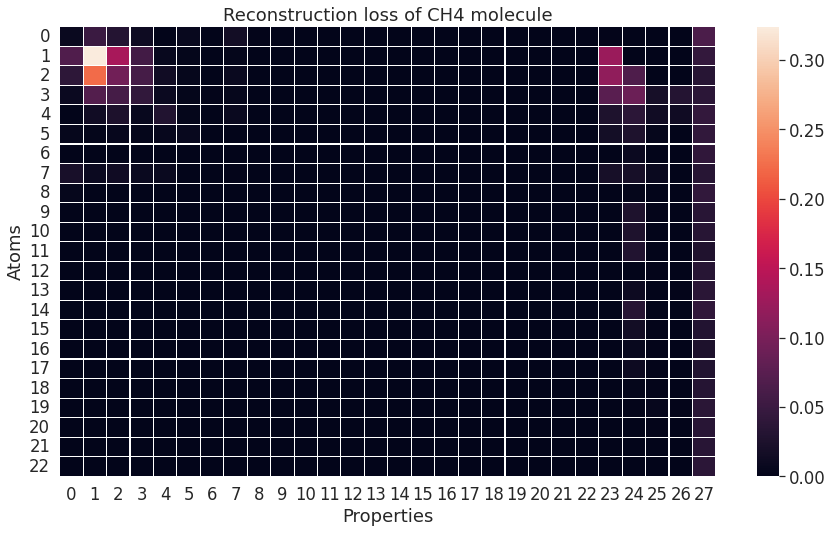

In [ ]:
sample_a = data_a[0]
sample_a = sample_a[np.newaxis, :]

_, _, z_a = vae_a.encoder(sample_a)
reconstruction_a = vae_a.decoder(z_a)

reconstruction_loss_a = tf.squeeze(tf.math.square(sample_a - reconstruction_a))

sns.set_theme()
sns.set(rc={'figure.figsize':(14.7,8.27)})
sns.set(font_scale=1.5)

cx = sns.heatmap(reconstruction_loss_a, linewidths=.1)
cx.set(xlabel='Properties', ylabel='Atoms')
cx.set(title='Reconstruction loss of CH4 molecule')
cx.figure.savefig("ch4-qm7-reconstruction-loss.png")

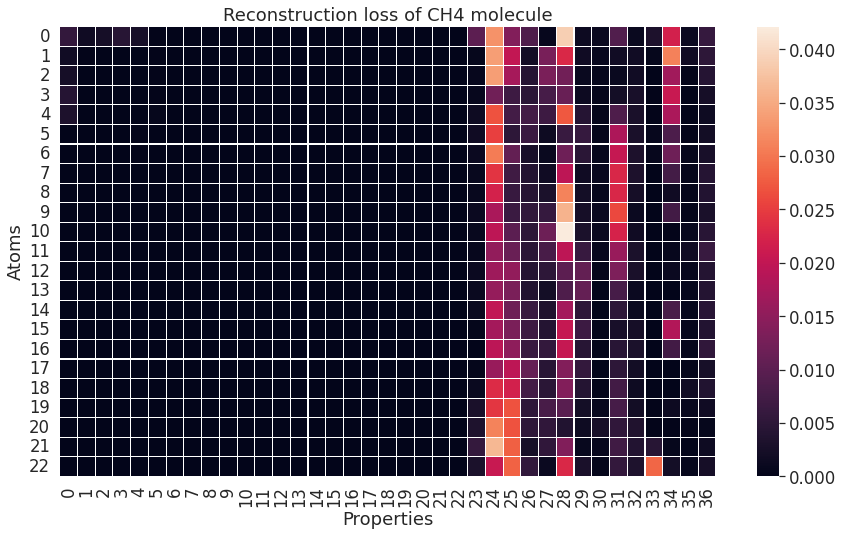

In [ ]:
sample_b = data_b[0]
sample_b = sample_b[np.newaxis, :]

_, _, z_b = vae_b.encoder(sample_b)
reconstruction_b = vae_b.decoder(z_b)

reconstruction_loss_b = tf.squeeze(tf.math.square(sample_b - reconstruction_b))

sns.set_theme()
sns.set(rc={'figure.figsize':(14.7,8.27)})
sns.set(font_scale=1.5)

dx = sns.heatmap(reconstruction_loss_b, linewidths=.1)
dx.set(xlabel='Properties', ylabel='Atoms')
dx.set(title='Reconstruction loss of CH4 molecule')
dx.figure.savefig("ch4-qm7b-reconstruction-loss.png")

###Clustering of the dataset and visualization of the latent space

In [ ]:
!pip install hdbscan

     |████████████████████████████████| 5.2 MB 4.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.28-cp37-cp37m-linux_x86_64.whl size=2330818 sha256=66d4ac20ea906782a22ee7f3f3a1beeb900a1c8171ede68f0c53b66967a687b4
  Stored in directory: /root/.cache/pip/wheels/6e/7a/5e/259ccc841c085fc41b99ef4a71e896b62f5161f2bc8a14c97a
Successfully built hdbscan


In [ ]:
import hdbscan
metrics = ['braycurtis', 'canberra','dice', 'jaccard', 'kulsinski', 'matching', 'rogerstanimoto', 'sokalsneath']  #list of working metrics

####Dataset A

First of all let's try to analyze our dataset in order to determine some possible clusters for the molecules. What we are interested in is **Coulomb Matrix**, with a particular focus on the *eigenvalues* of the matrix. We try to follow an approach that uses matrix decomposition using **S**ingle **V**alue **D**ecomposition.

*Please note X is the Coulomb matrix in qm7 notation*

In [ ]:
data_a_X = data_a[:, :, 0:23]
data_a_X = np.squeeze(data_a_X)

Computation of Eigenvalues according to Kaggle notebook:

In [ ]:
_, eigvals, _ = np.linalg.svd(data_a_X)
eigvals[0]

array([0.12338872, 0.09870794, 0.01202215, 0.00651588, 0.00322781,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        ], dtype=float32)

Computation of Eigenvalues according to Numpy method:

In [ ]:
eigvals2 = np.linalg.eigvals(data_a_X)
eigvals2[0]

array([ 0.12338872, -0.09870794,  0.00322781, -0.01202215, -0.00651588,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ], dtype=float32)

Now let's try to perform some clustering on Eigenvalues using HDBScan library to use an automated method of getting the number of clusters:

In [ ]:
def clusterData(metric, eigvals):
  clusterer = hdbscan.HDBSCAN(metric=metric, min_cluster_size= 5, min_samples = 5)
  clusterer.fit(eigvals)
  return clusterer

Once defined the function making clustering on eigenvalues let's try to plot and visualize the different clusters into the latent space obtained using various kinds of metrics:

In [ ]:
import matplotlib.pyplot as plt

          z1        z2  label
5  -3.233666 -0.964841     -1
6  -2.630116 -1.026400     -1
7  -2.567159  0.517213     -1
8  -1.726716 -0.934038     -1
9  -2.516903 -0.205730     -1
10 -3.200115  0.257082     -1
11 -2.782799 -2.149622     -1
12 -1.964045 -0.027597     -1
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727     -1


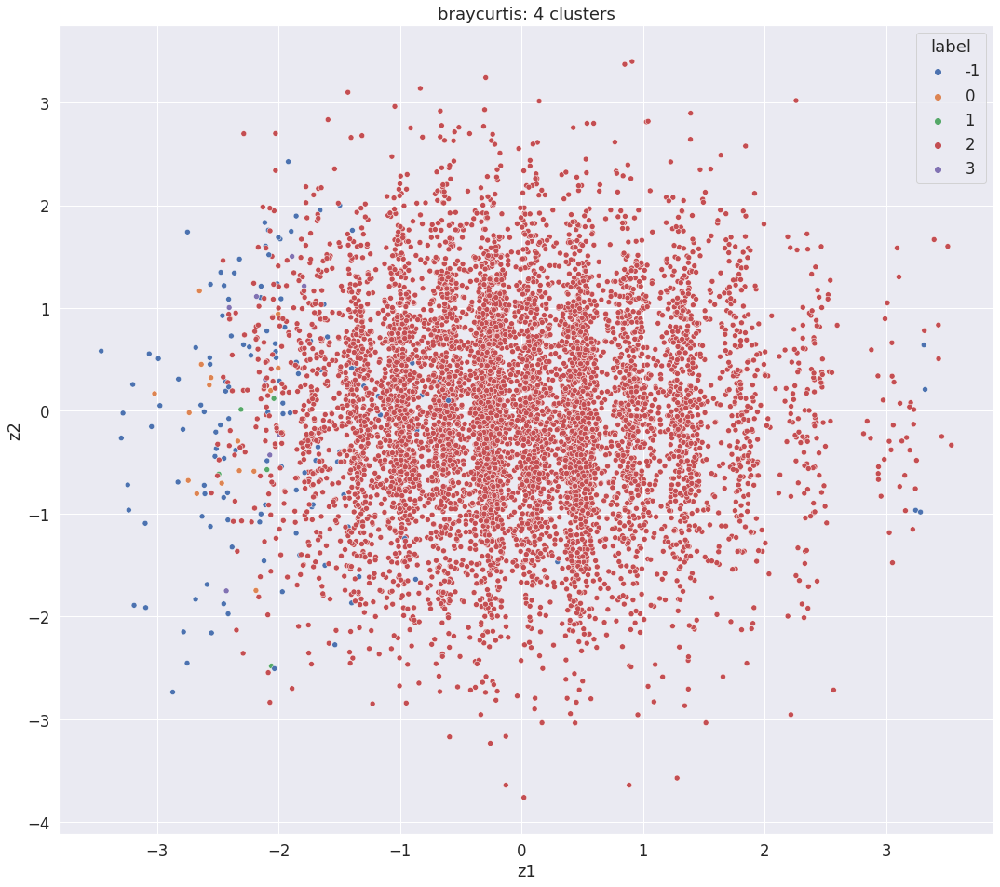

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400     -1
7  -2.567159  0.517213     -1
8  -1.726716 -0.934038     -1
9  -2.516903 -0.205730     -1
10 -3.200115  0.257082      0
11 -2.782799 -2.149622     -1
12 -1.964045 -0.027597     -1
13 -3.046108 -0.153240      0
14 -2.364883  1.341727     -1


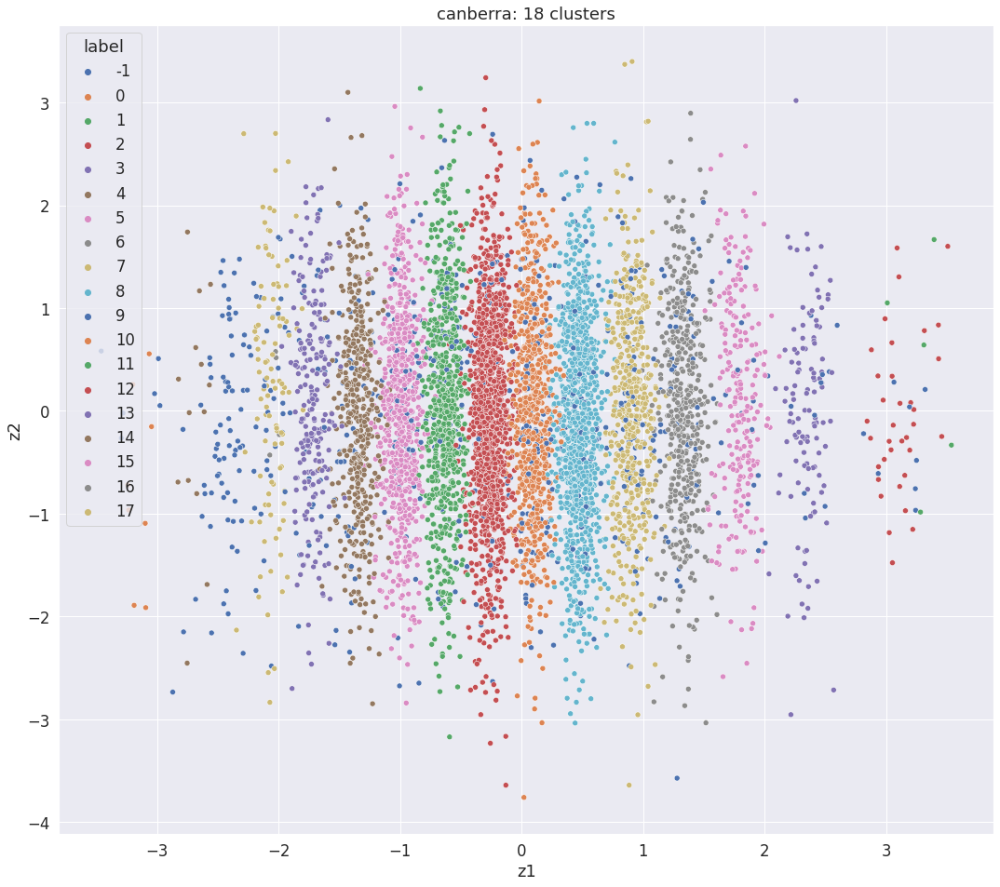

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


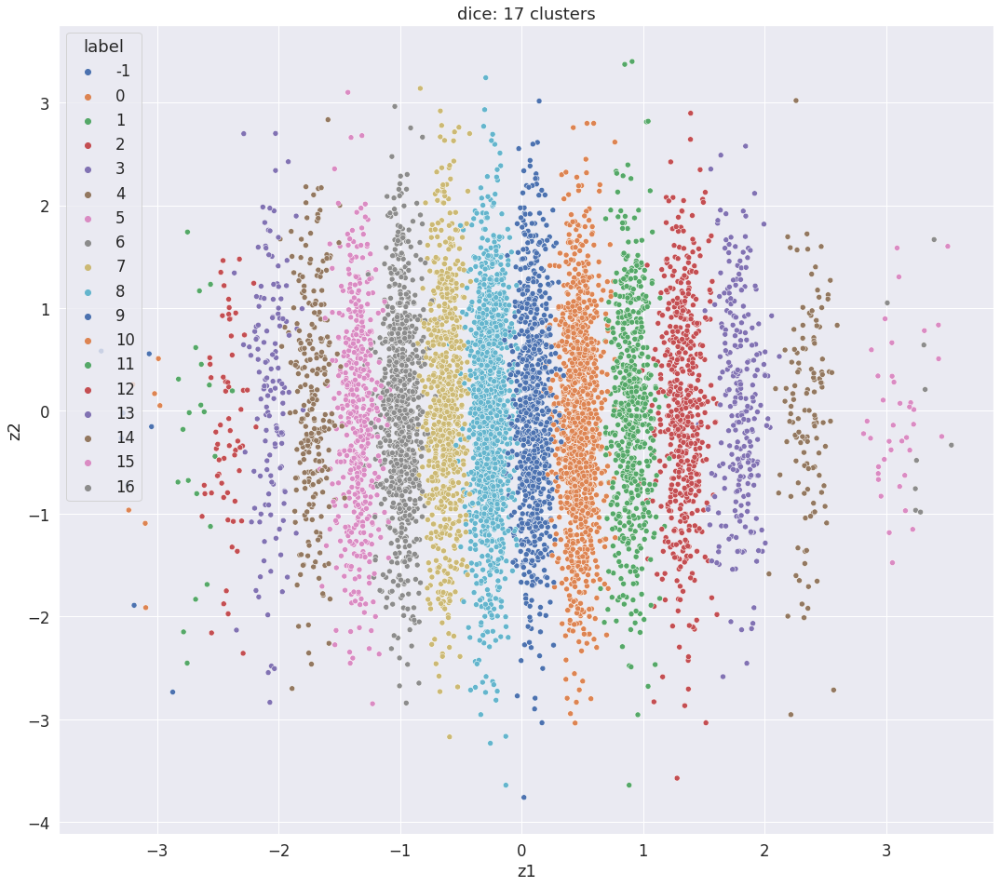

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


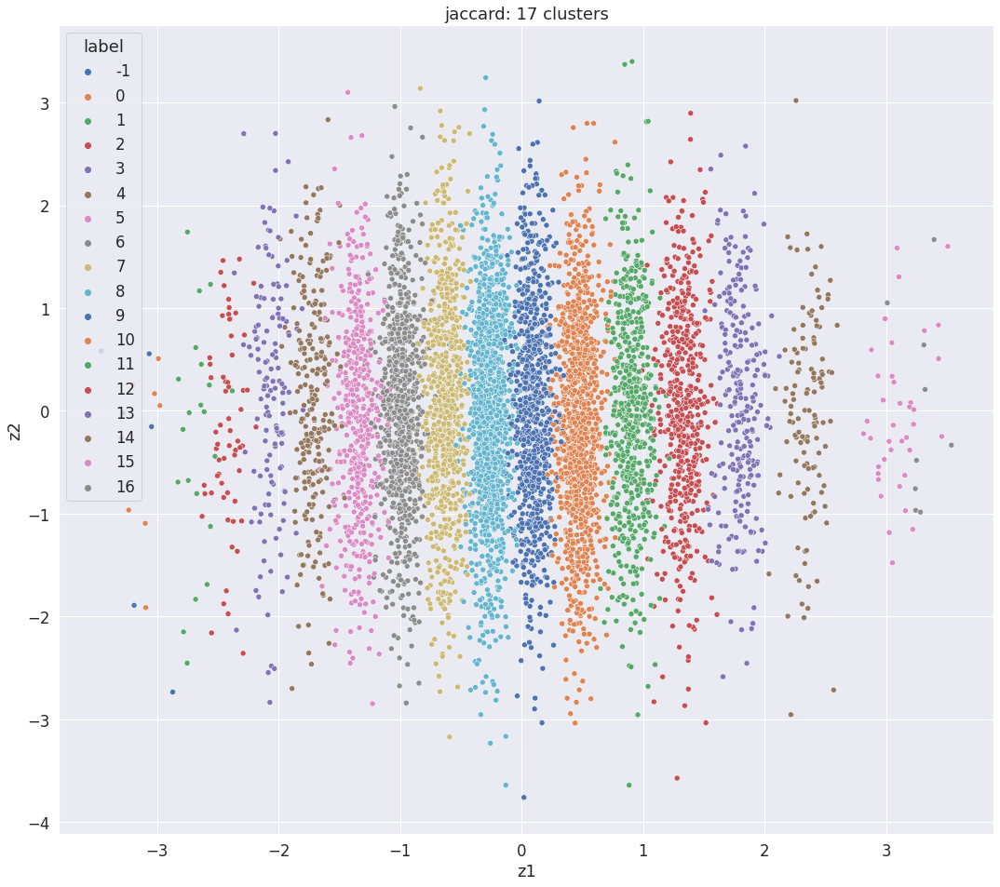

          z1        z2  label
5  -3.233666 -0.964841      1
6  -2.630116 -1.026400      3
7  -2.567159  0.517213      3
8  -1.726716 -0.934038      5
9  -2.516903 -0.205730      3
10 -3.200115  0.257082      1
11 -2.782799 -2.149622      2
12 -1.964045 -0.027597      4
13 -3.046108 -0.153240      0
14 -2.364883  1.341727      4


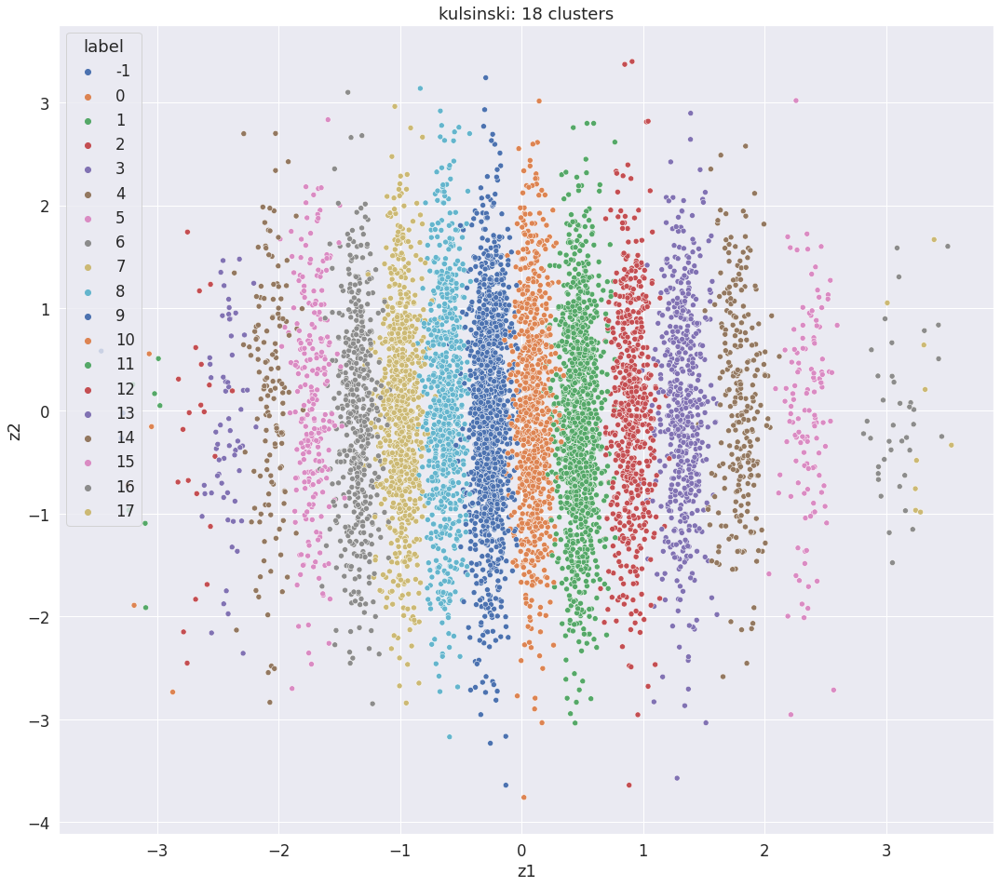

          z1        z2  label
5  -3.233666 -0.964841     13
6  -2.630116 -1.026400     15
7  -2.567159  0.517213     15
8  -1.726716 -0.934038     12
9  -2.516903 -0.205730     15
10 -3.200115  0.257082     13
11 -2.782799 -2.149622     14
12 -1.964045 -0.027597     16
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727     16


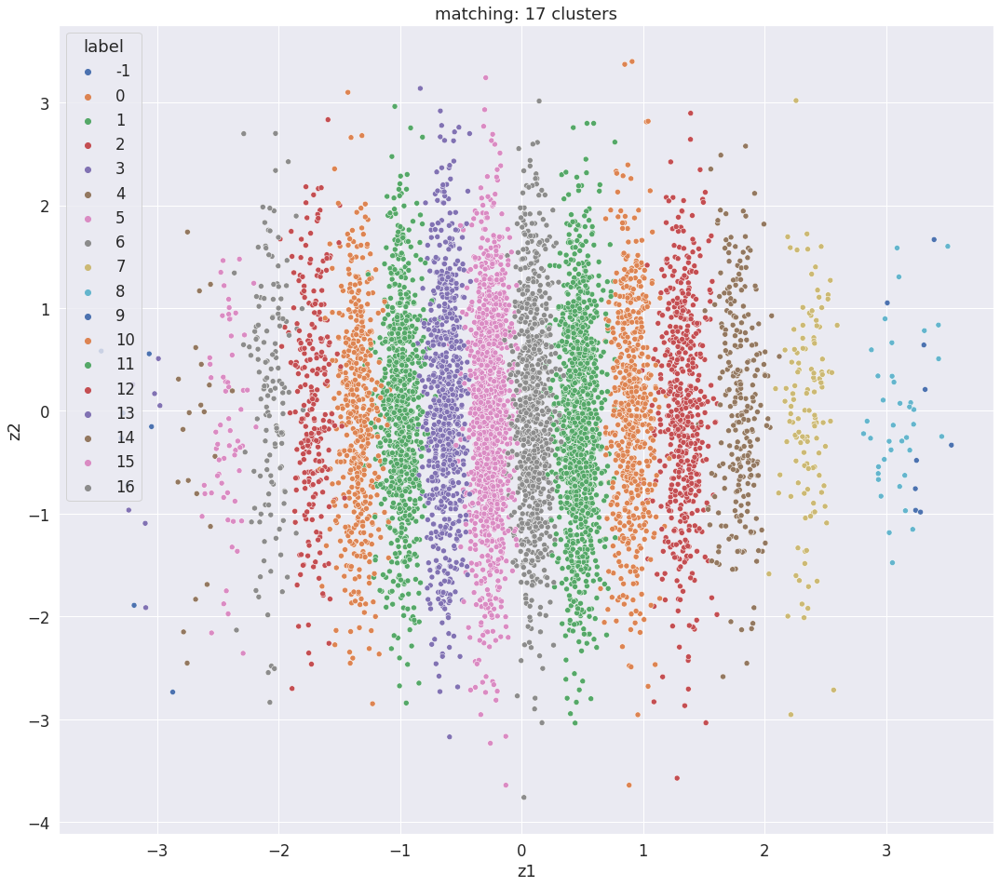

          z1        z2  label
5  -3.233666 -0.964841     12
6  -2.630116 -1.026400     11
7  -2.567159  0.517213     11
8  -1.726716 -0.934038     15
9  -2.516903 -0.205730     11
10 -3.200115  0.257082     12
11 -2.782799 -2.149622     13
12 -1.964045 -0.027597     14
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727     14


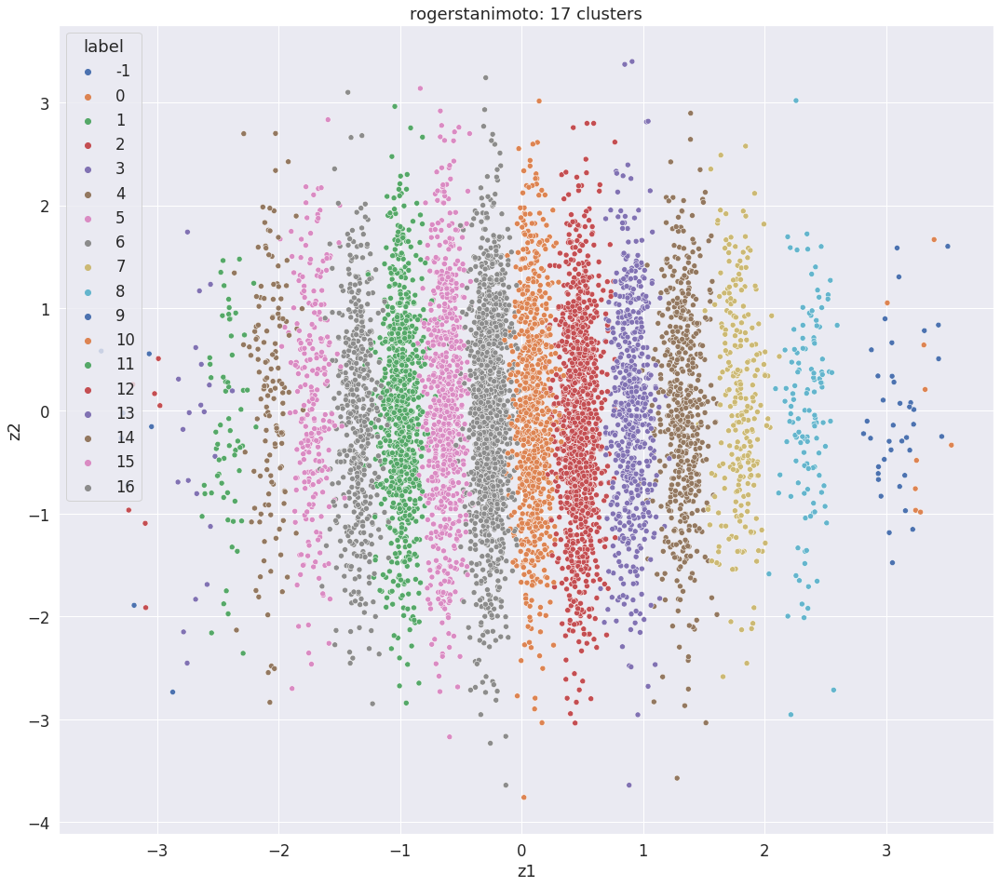

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


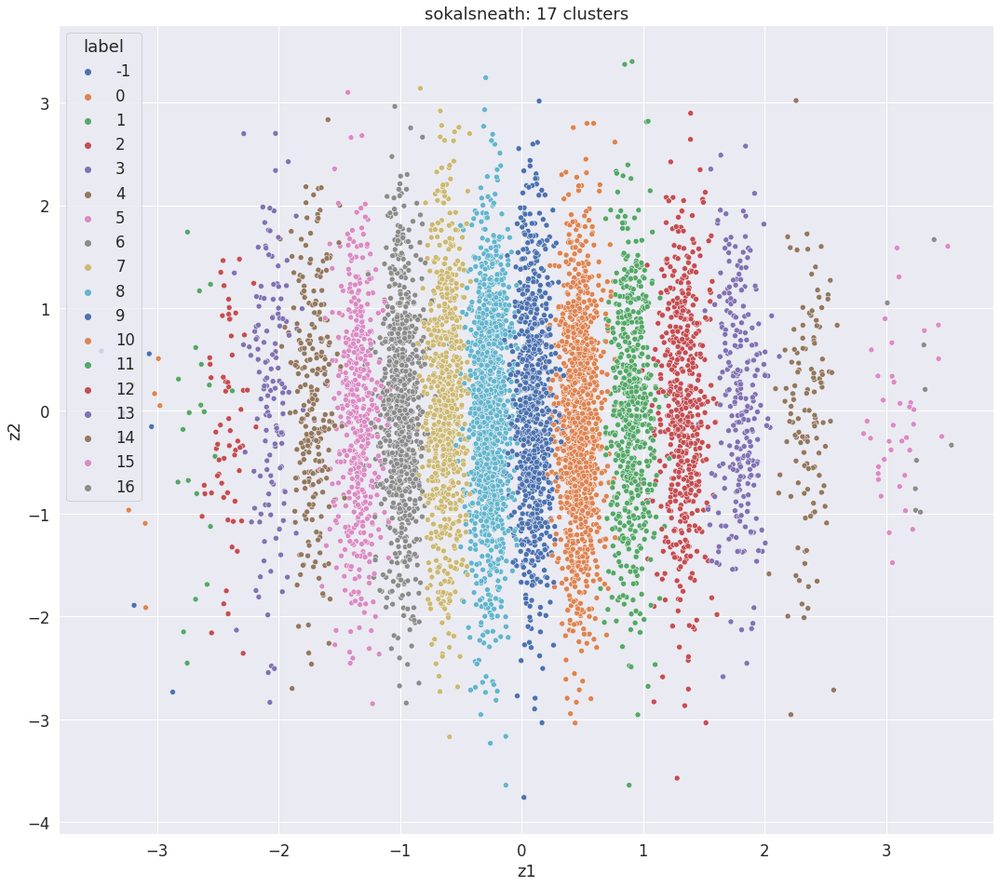

In [ ]:
z1 = []
z2 = []

_, _, latent_a = vae_a.encoder(data_a)

for i in range(data_a.shape[0]):    
    z1.append(latent_a.numpy()[i][0])
    z2.append(latent_a.numpy()[i][1])

df = pd.DataFrame()
df['z1'] = z1
df['z2'] = z2

outliers = dict()

for metric in metrics:
  clusterer = clusterData(metric, eigvals)
  df['label'] = clusterer.labels_
  outliers.update({metric: len(df[df.label==-1])})
  print(df[5:15])
  plt.figure(figsize=(18, 16))
  sns.scatterplot(x='z1', y='z2', hue='label', data=df, palette='deep')
  plt.title(metric+": "+str(clusterer.labels_.max()+1)+" clusters")
  plt.savefig('data_a_clustering_'+metric+'.png')
  plt.show()


Here we can evaluate how many different outliers are generated using different metrics to generate clusters of molecules into the latent space:

In [ ]:
print(outliers)

{'braycurtis': 140, 'canberra': 695, 'dice': 8, 'jaccard': 8, 'kulsinski': 3, 'matching': 8, 'rogerstanimoto': 8, 'sokalsneath': 8}


$kulsinski$ metric appears to be the best one, therefore it creates 18 clusters of data with a good separation and only 3 outliers out of 7165 different molecules.

####Dataset B

In [ ]:
metrics_b = ['braycurtis', 'canberra', 'chebyshev', 'cityblock', 'dice', 'euclidean', 'hamming', 'infinity', 'jaccard', 'kulsinski', 'l1', 'l2', 'manhattan', 'matching', 'p', 'rogerstanimoto', 'russellrao', 'sokalmichener', 'sokalsneath']

Again let's try to analyze our dataset in order to determine some possible clusters for the molecules:

In [ ]:
data_b_X = data_b[:, :, 0:23]
data_b_X = np.squeeze(data_b_X)

Computation of Eigenvalues according to Kaggle notebook:

In [ ]:
_, eigvals_b, _ = np.linalg.svd(data_b_X)
eigvals_b[0]

array([0.186732  , 0.08873025, 0.00612701, 0.00504746, 0.00460998,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        ])

Once got the clusters, let's try to plot and visualize them into the latent space:

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


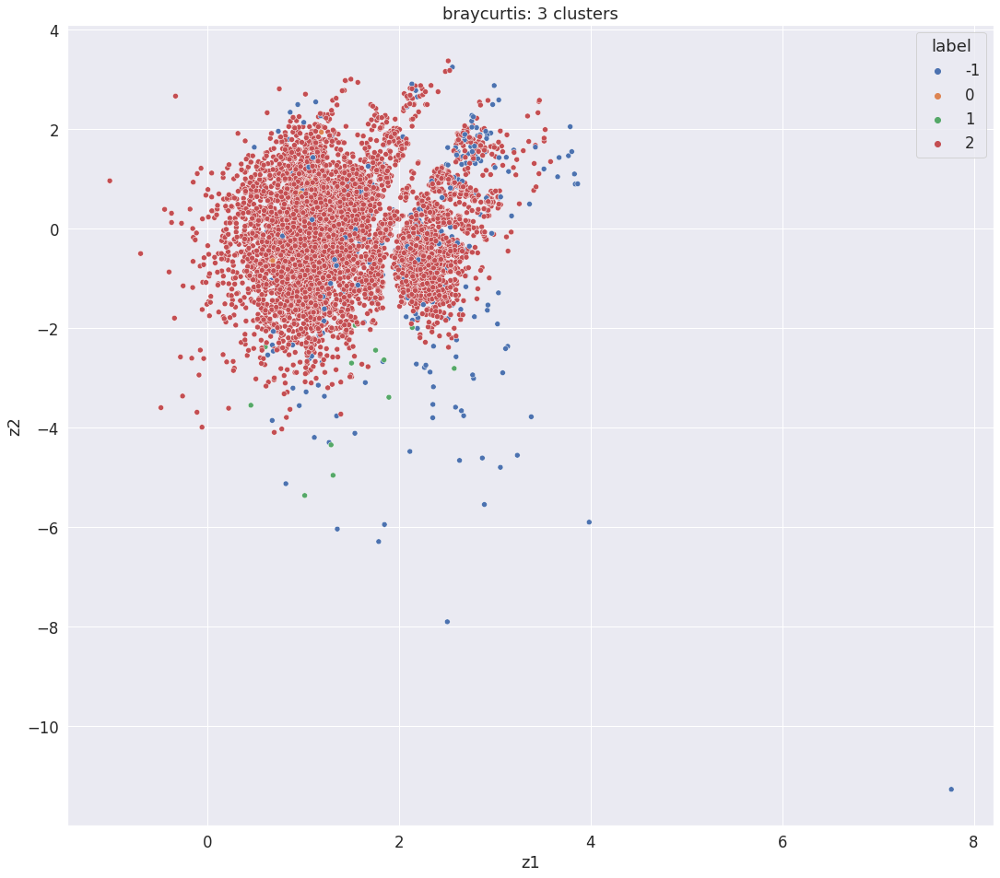

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


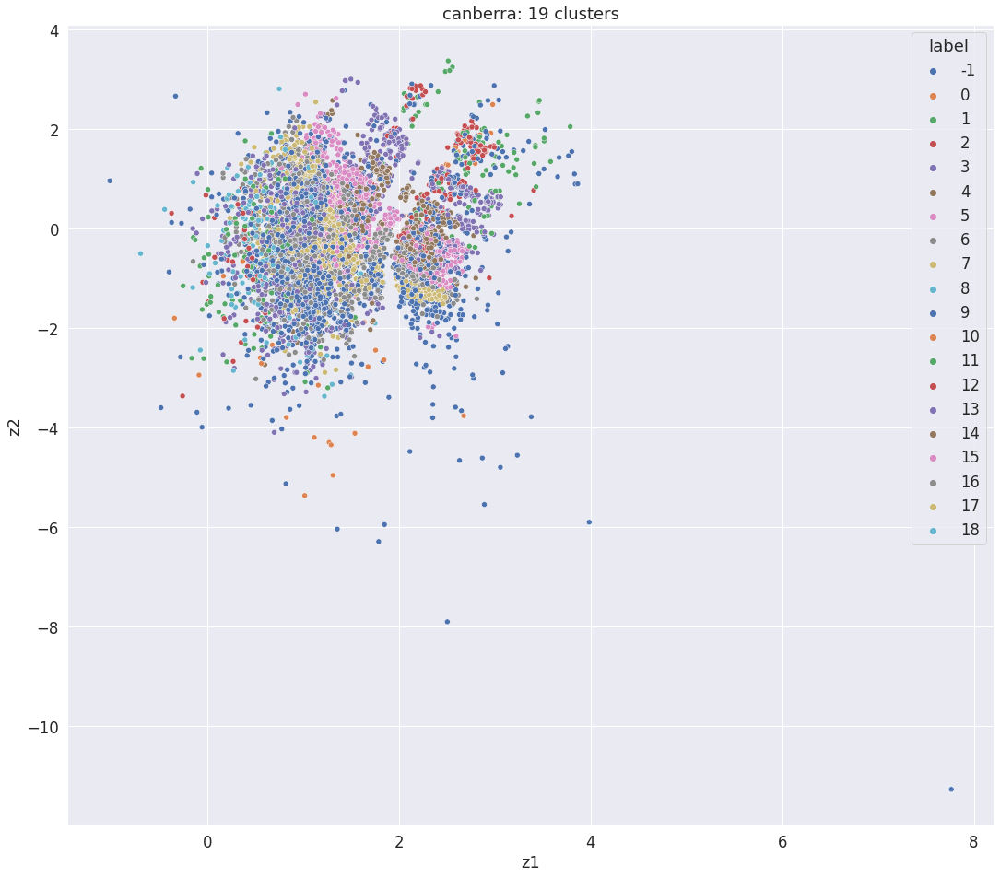

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


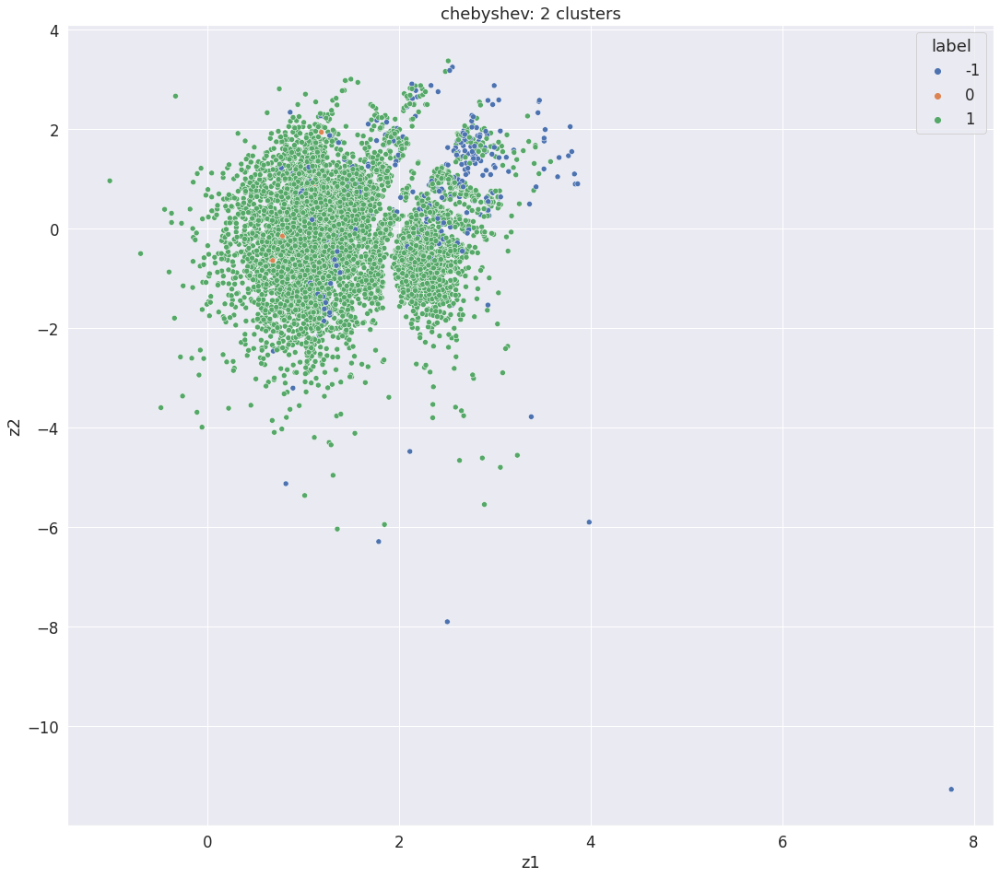

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


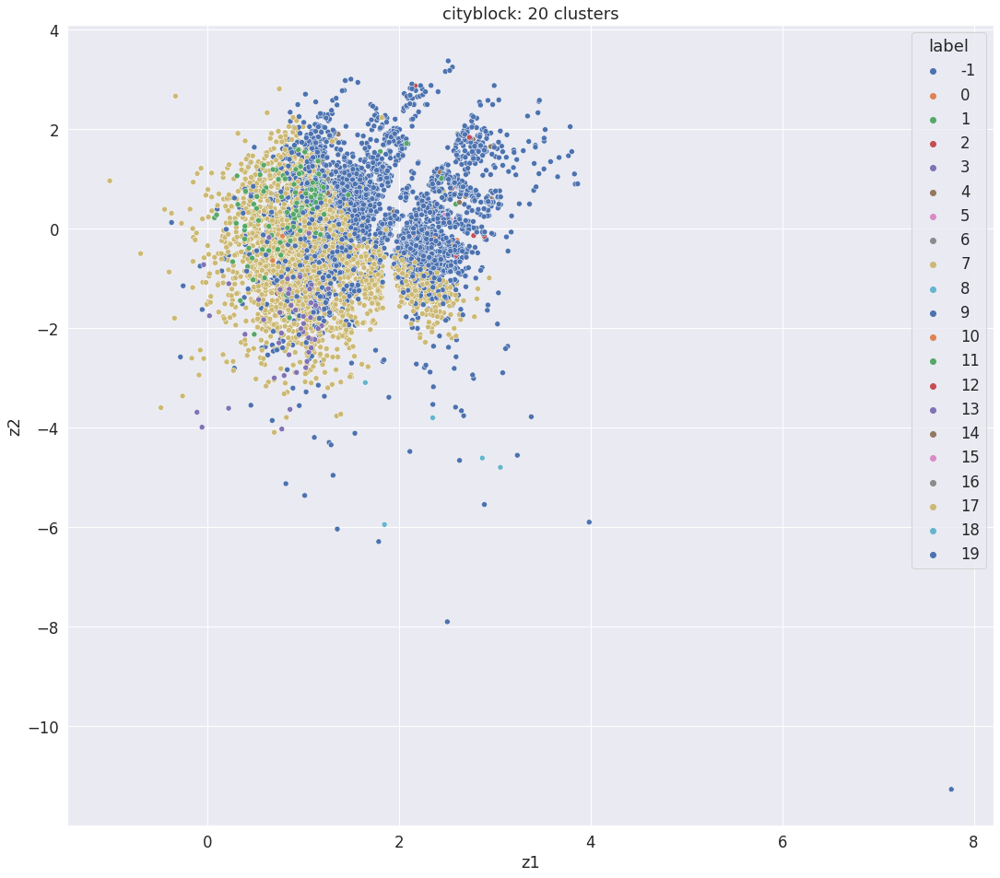

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


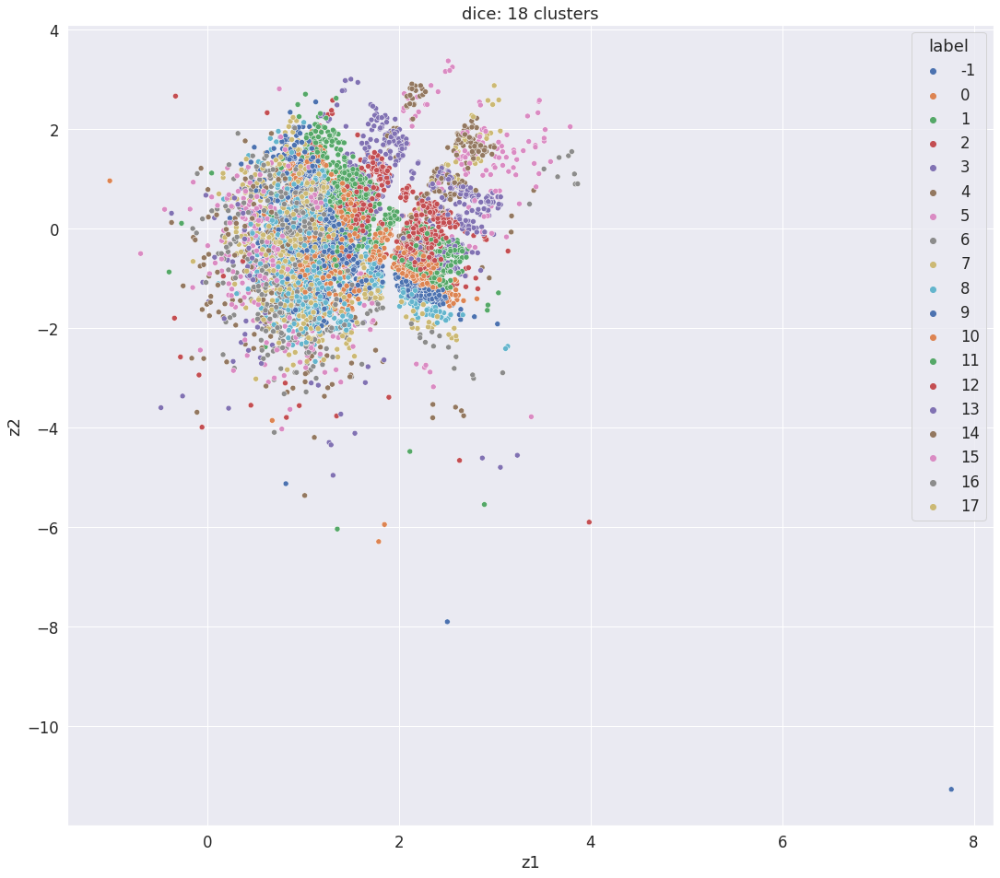

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


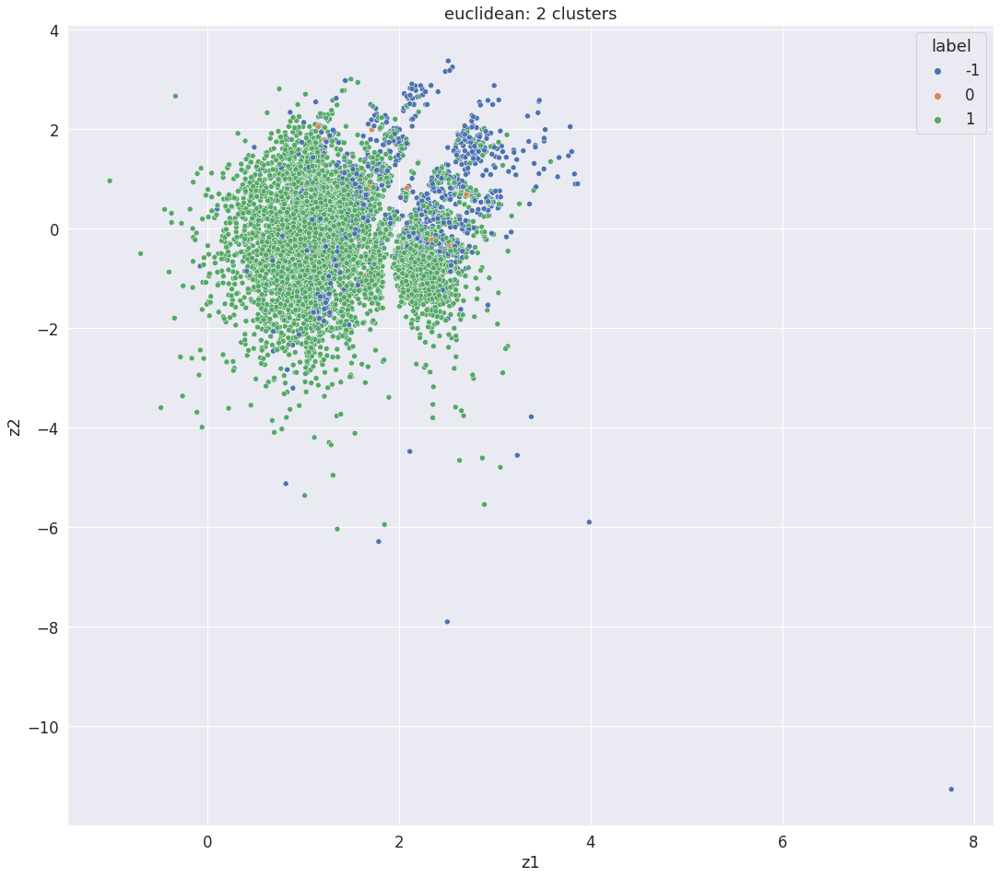

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


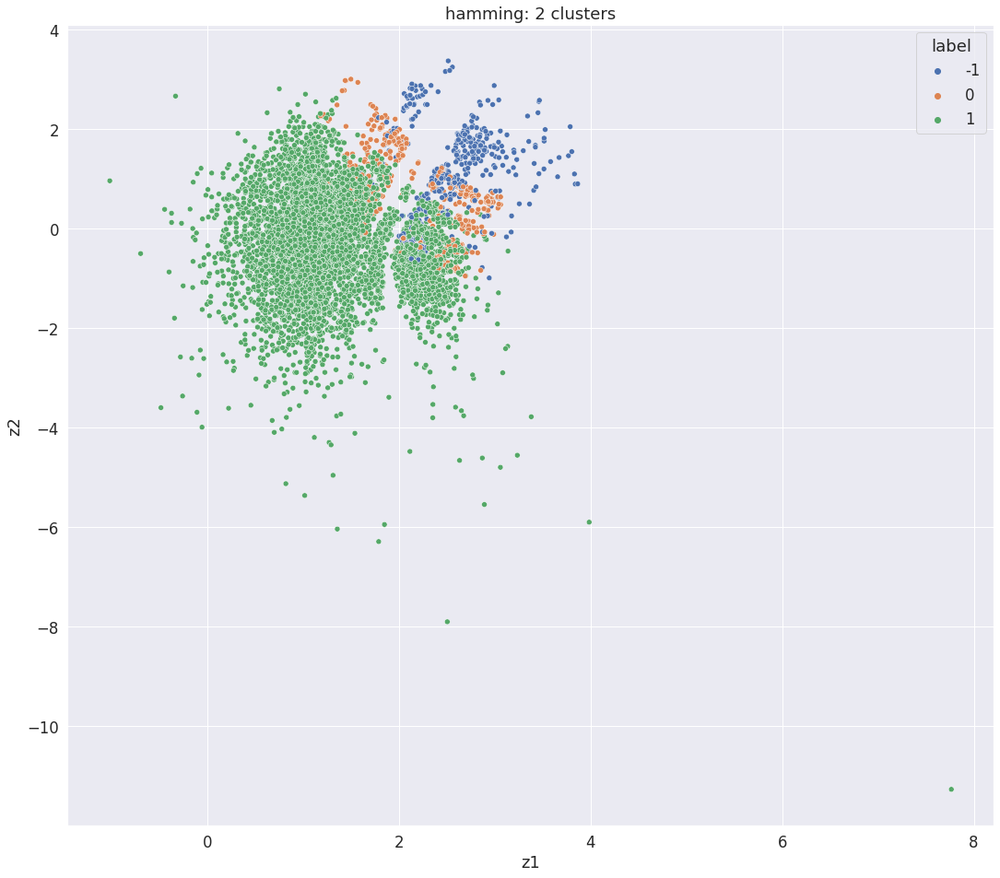

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


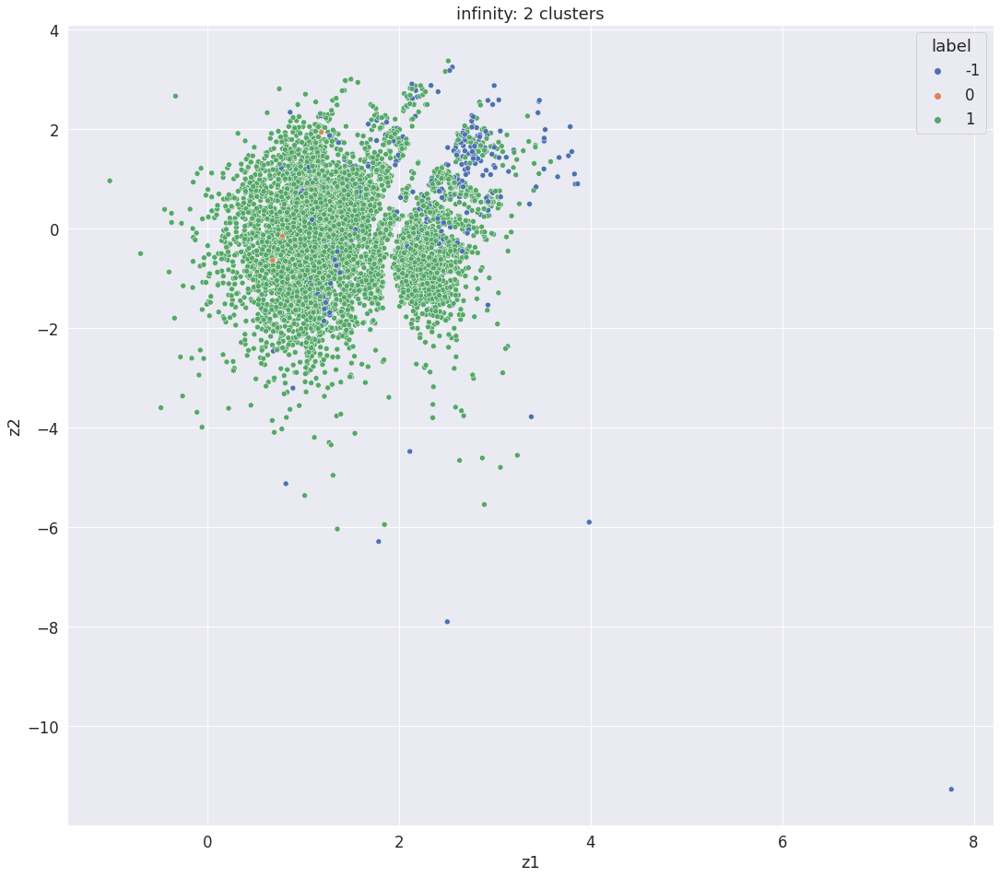

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


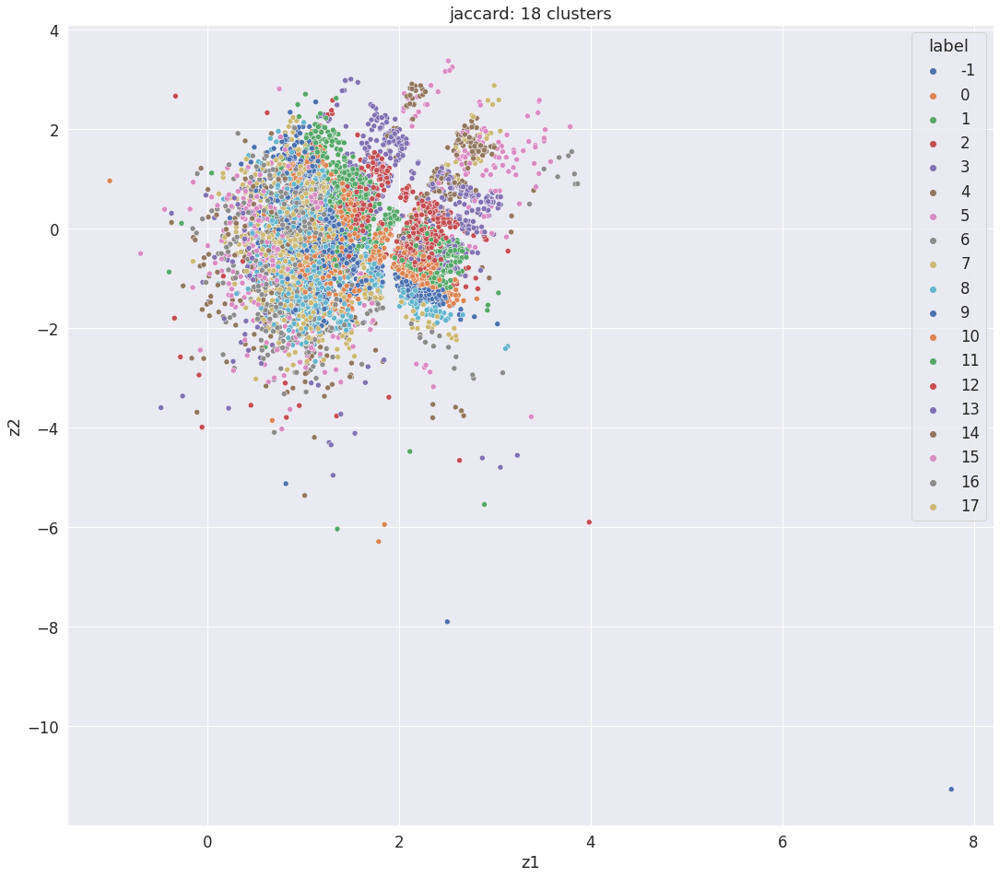

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


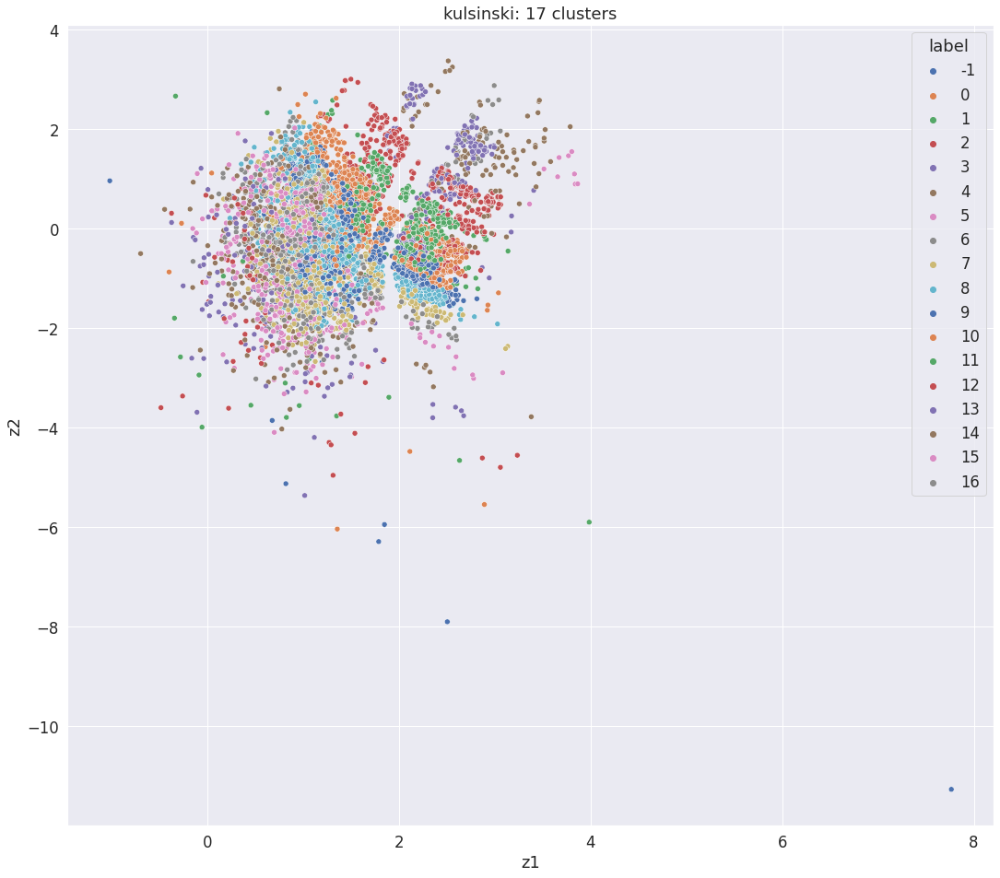

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


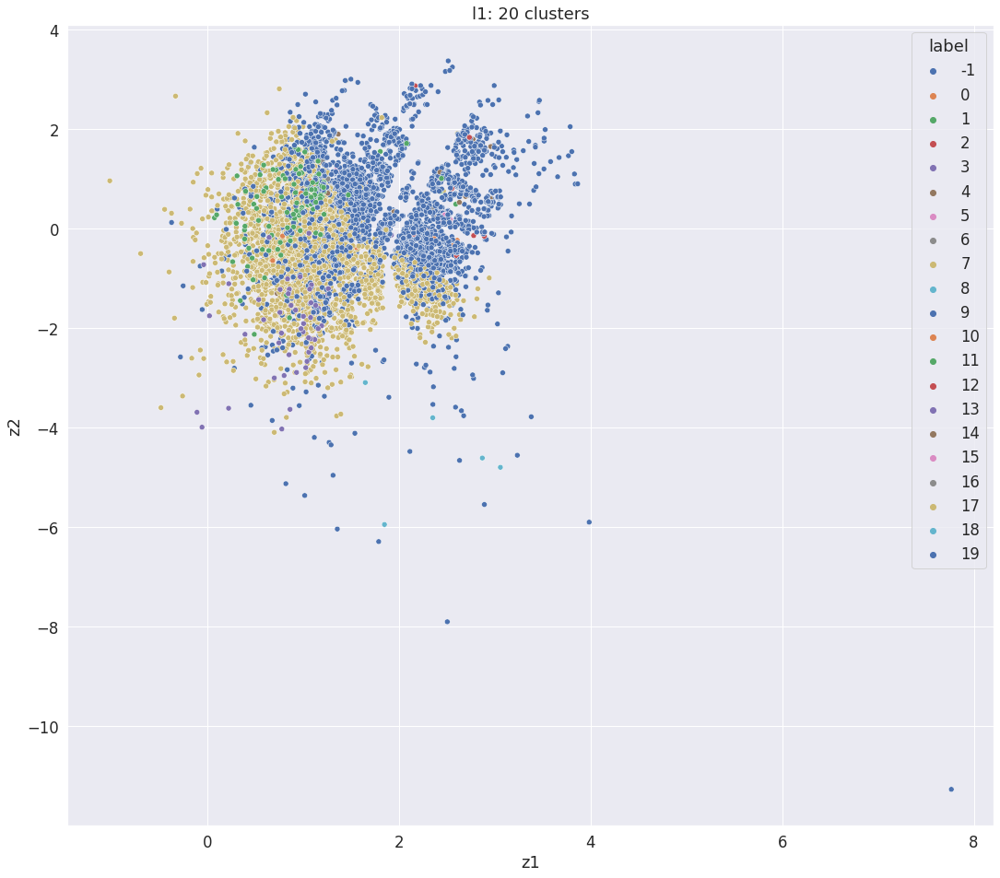

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


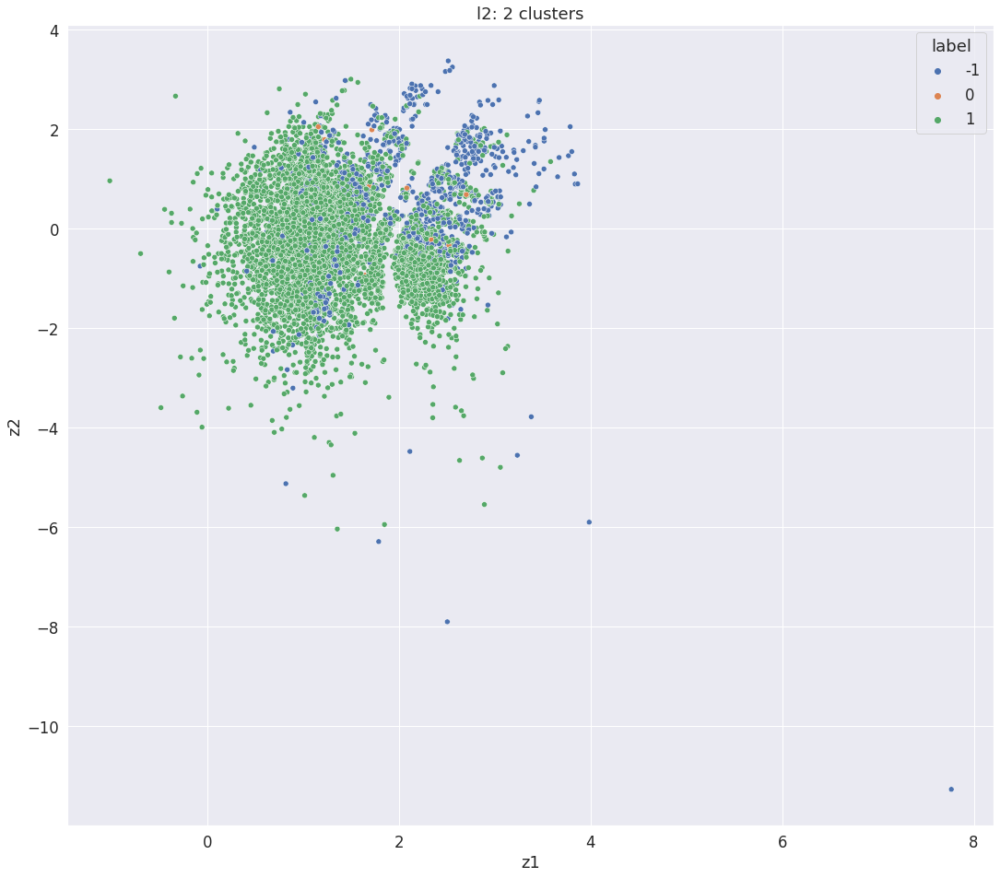

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


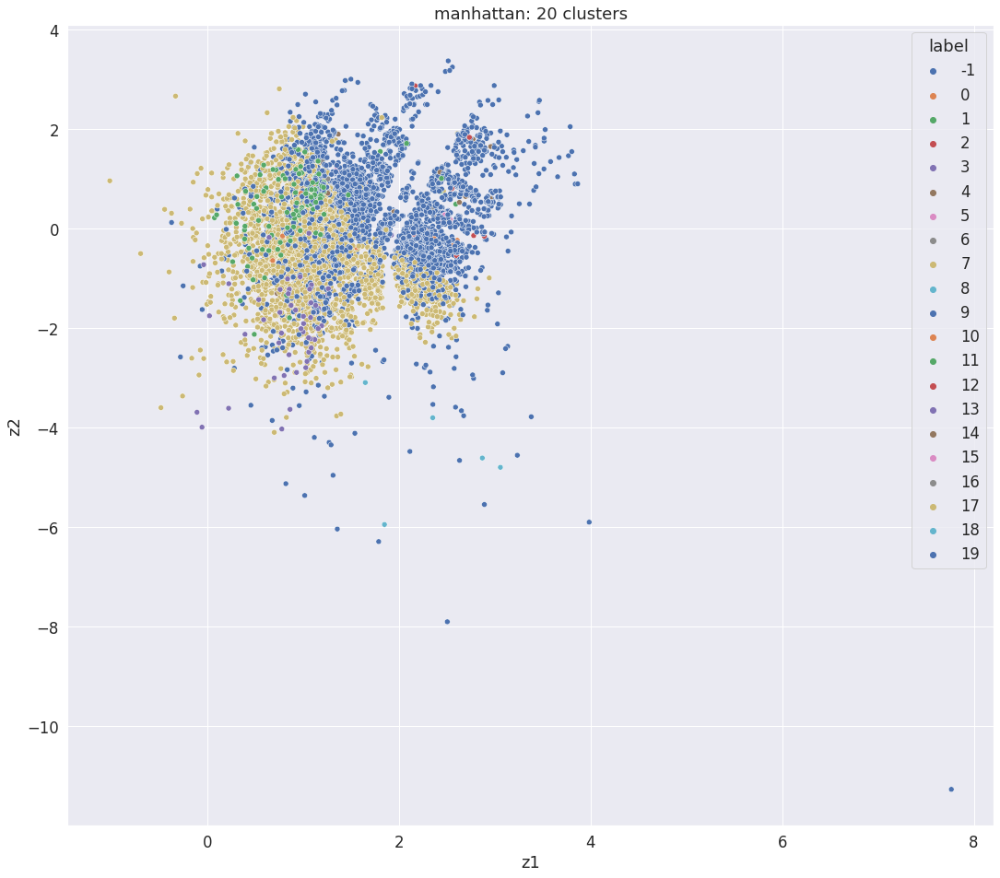

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


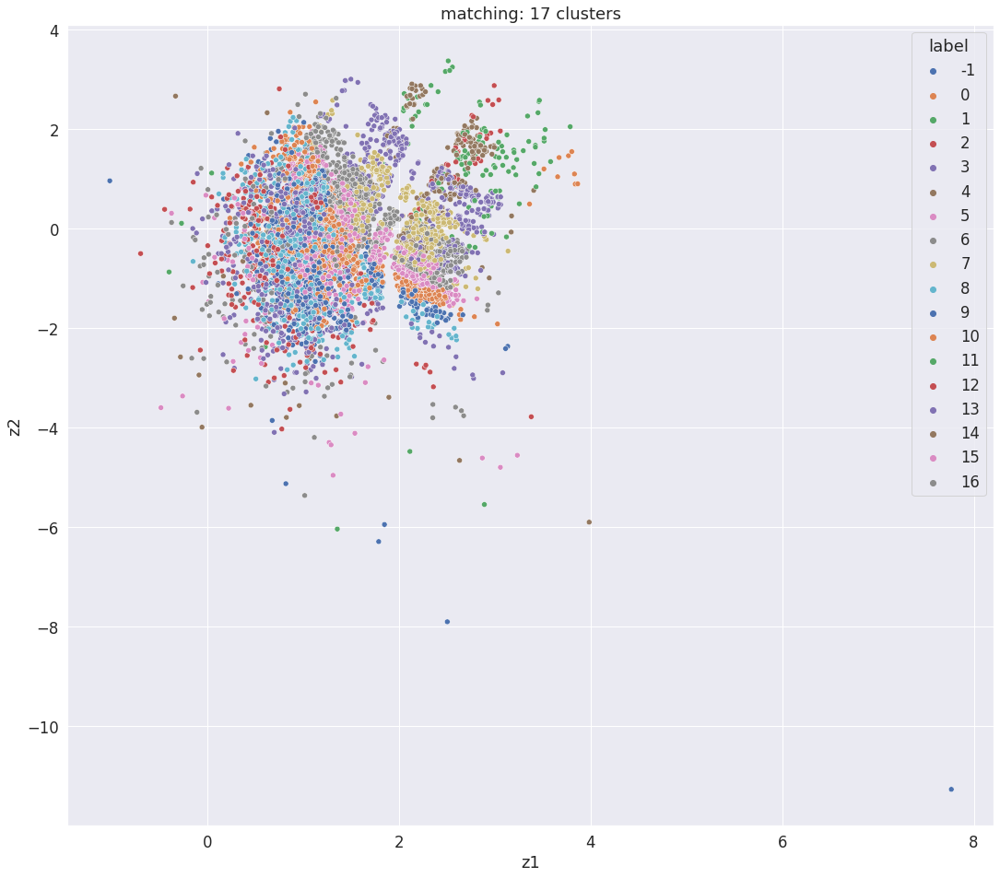

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


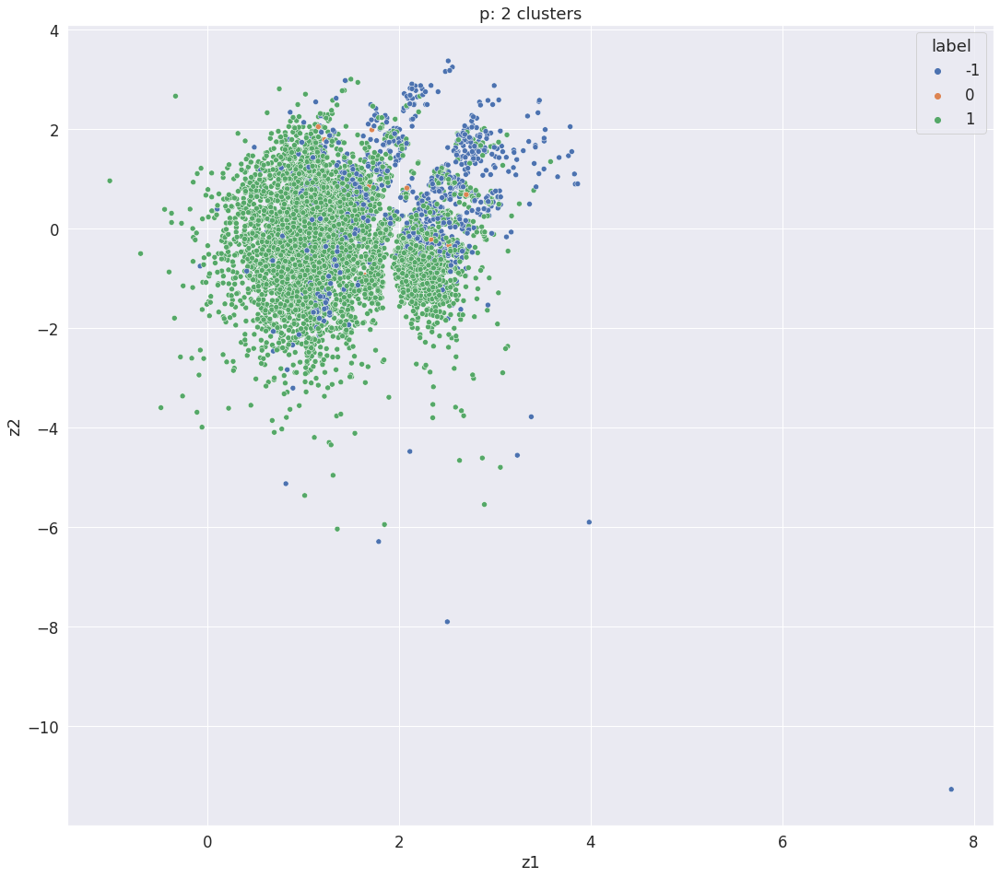

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


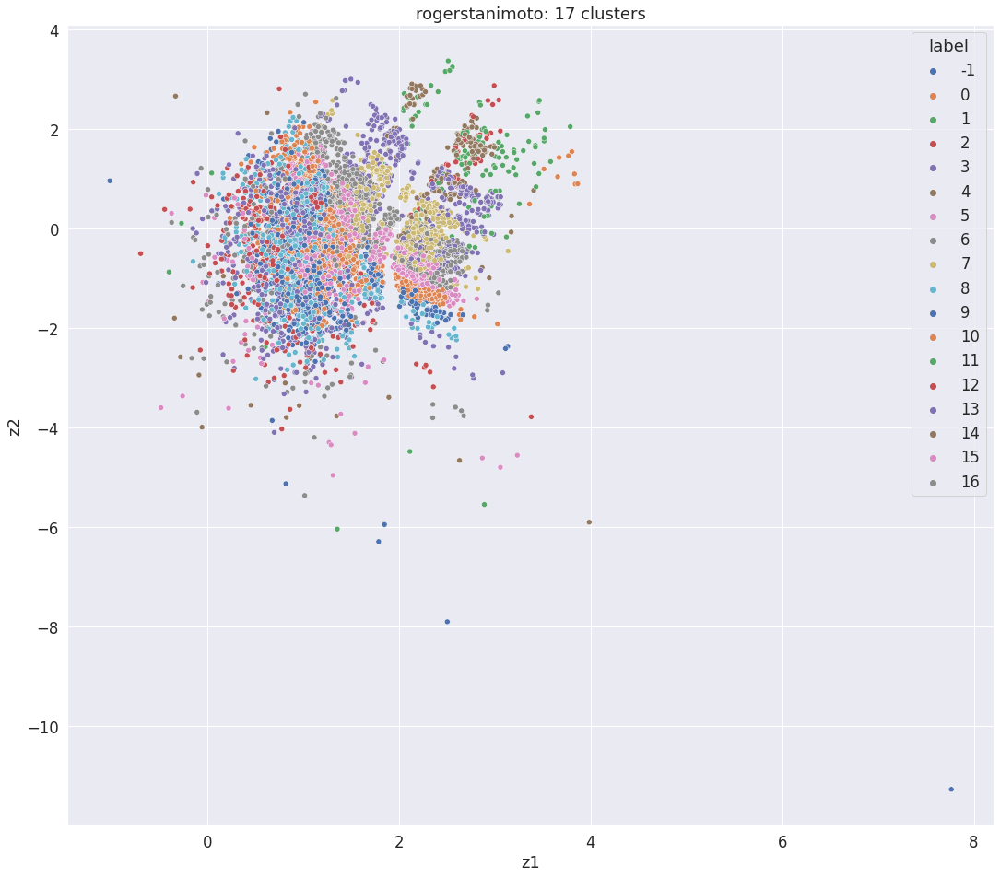

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


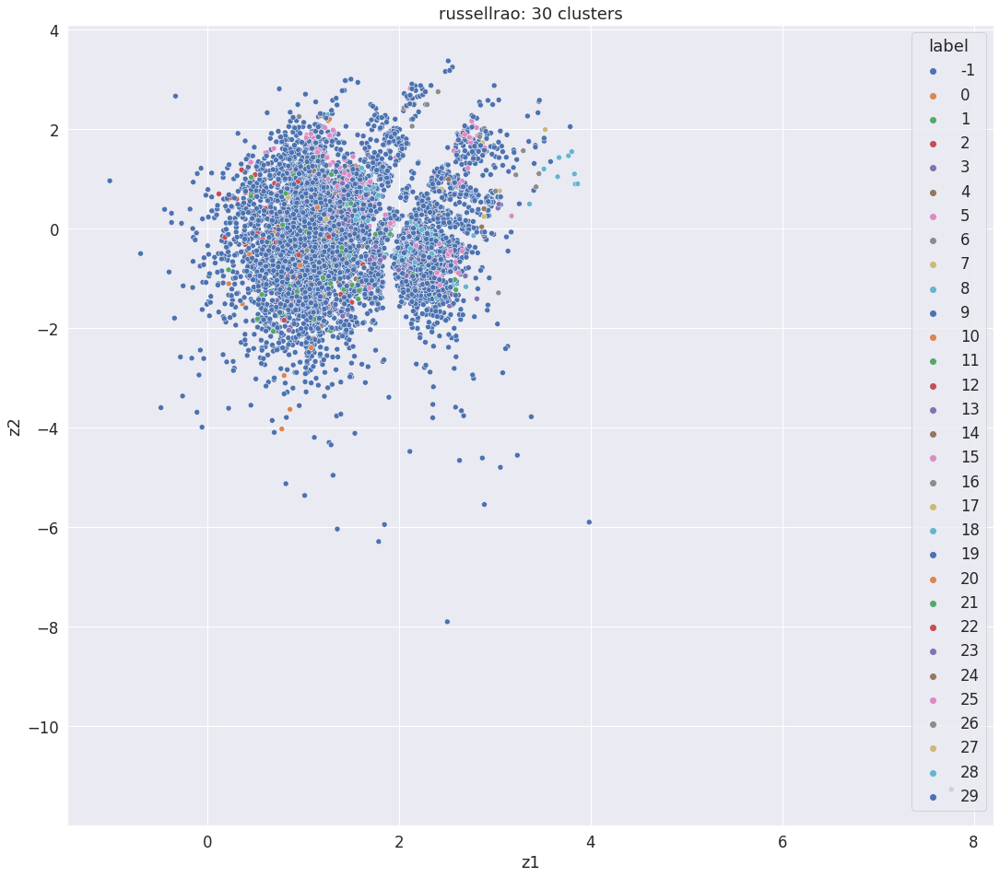

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


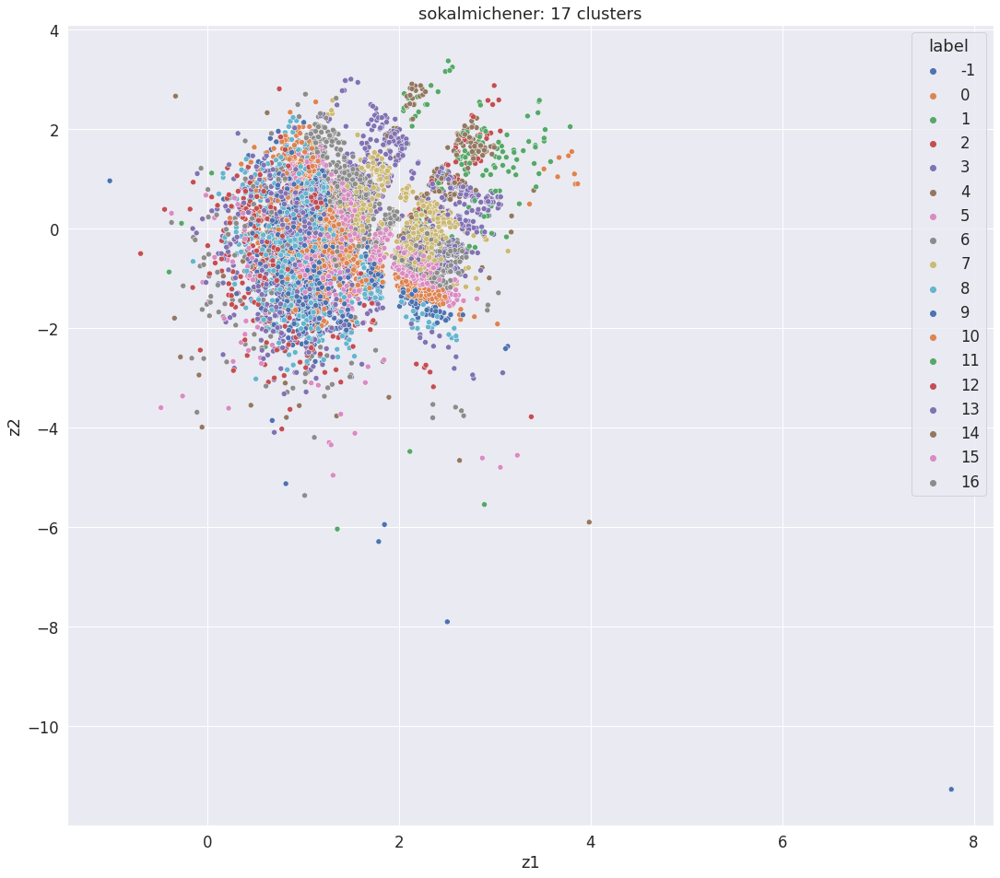

          z1        z2  label
5  -3.233666 -0.964841      0
6  -2.630116 -1.026400      2
7  -2.567159  0.517213      2
8  -1.726716 -0.934038      4
9  -2.516903 -0.205730      2
10 -3.200115  0.257082      0
11 -2.782799 -2.149622      1
12 -1.964045 -0.027597      3
13 -3.046108 -0.153240     -1
14 -2.364883  1.341727      3


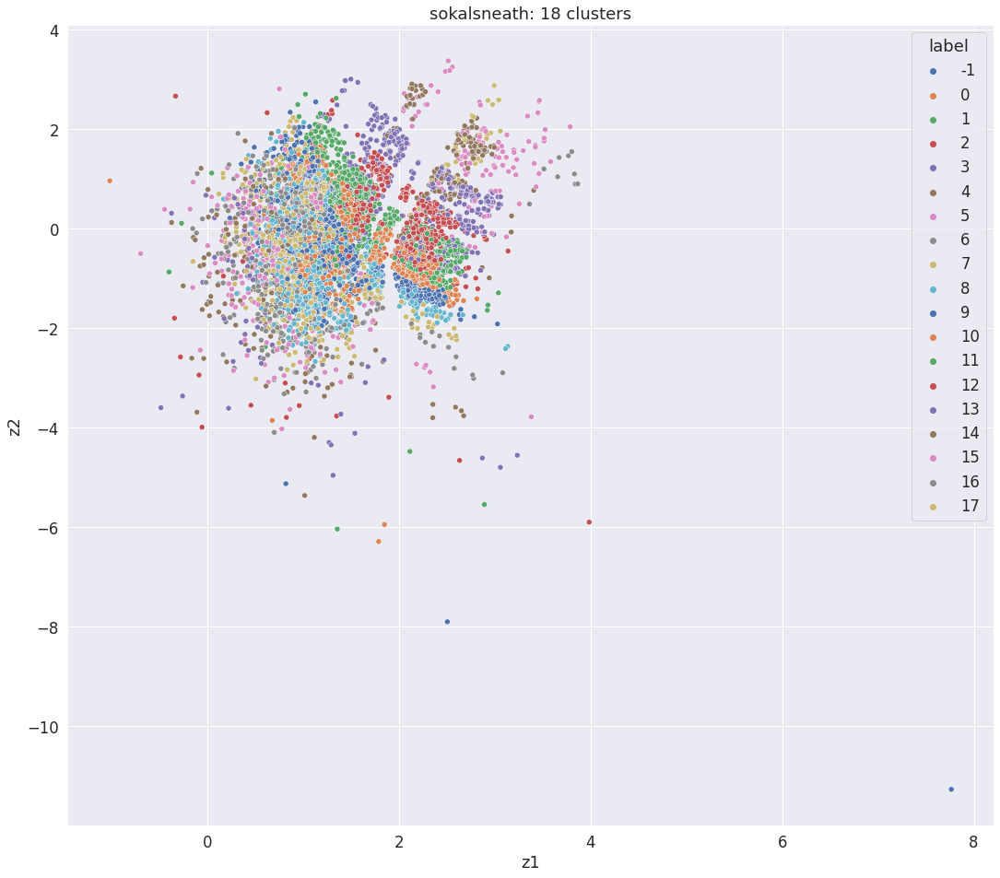

In [ ]:
z1_b = []
z2_b = []

_, _, latent_b = vae_b.encoder(data_b)

for i in range(data_b.shape[0]):    
    z1_b.append(latent_b.numpy()[i][0])
    z2_b.append(latent_b.numpy()[i][1])

df_b = pd.DataFrame()
df_b['z1'] = z1_b
df_b['z2'] = z2_b

outliers_b = dict()

for metric in metrics_b:
  clusterer = clusterData(metric, eigvals_b)
  df_b['label'] = clusterer.labels_
  outliers_b.update({metric: len(df_b[df_b.label==-1])})
  print(df[5:15])
  plt.figure(figsize=(18, 16))
  sns.scatterplot(x='z1', y='z2', hue='label', data=df_b, palette='deep')
  plt.title(metric+": "+str(clusterer.labels_.max()+1)+" clusters")
  plt.savefig('data_b_clustering_'+metric+'.png')
  plt.show()

Here we can evaluate how many different outliers are generated using different metrics to generate clusters of molecules into the latent space:

In [ ]:
print(outliers_b)

{'braycurtis': 404, 'canberra': 1343, 'chebyshev': 287, 'cityblock': 3515, 'dice': 3, 'euclidean': 975, 'hamming': 480, 'infinity': 287, 'jaccard': 3, 'kulsinski': 8, 'l1': 3515, 'l2': 975, 'manhattan': 3515, 'matching': 8, 'p': 975, 'rogerstanimoto': 8, 'russellrao': 6086, 'sokalmichener': 8, 'sokalsneath': 3}


###Dataset C

A third dataset might be taken into consideration to train a VAE first and then to execute a clustering task. The dataset is composed by data belonging to $qm7$ dataset labeled with X, therefore the 7165 different 23 x 23 Coulomb matrices, qm7['X']:

In [ ]:
qm7['X'].shape

(7165, 23, 23)

Let's create *data_c*:

In [ ]:
data_c_unnorm = qm7['X']

Then, a further dimension is added to make dataset suitable for training the model:

In [ ]:
data_c_unnorm = np.expand_dims(data_c_unnorm, -1)

We do normalization:

In [ ]:
data_c = (data_c_unnorm - data_c_unnorm.min(axis=0)) / (data_c_unnorm.max(axis=0) - data_c_unnorm.min(axis=0))

...and shuffling:

In [ ]:
np.random.shuffle(data_c)

Another step is dataset splitting, still according to 80%/20% schema:

In [ ]:
data_c_train = data_c[0:round(molecule_qty*0.8)]
data_c_validation = data_c[round(molecule_qty*0.8):molecule_qty]

Then, encoder and decoder are instantiated:

In [ ]:
encoder_c = encoder(23, 23, 1, latent_dim)
decoder_c = decoder(23, 23, latent_dim)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 23, 23, 1)]  0           []                               
                                                                                                  
 conv2d_5 (Conv2D)              (None, 23, 23, 16)   160         ['input_5[0][0]']                
                                                                                                  
 conv2d_6 (Conv2D)              (None, 23, 23, 32)   4640        ['conv2d_5[0][0]']               
                                                                                                  
 flatten_2 (Flatten)            (None, 16928)        0           ['conv2d_6[0][0]']               
                                                                                            

Consequently, we can train our model:

In [ ]:
vae_c = VAE(encoder_c, decoder_c)
vae_c.compile(optimizer=keras.optimizers.Adam())
vae_c.fit(data_c_train, epochs=70, batch_size=128)

Epoch 1/70
46/46 [==============================] - 2s 13ms/step - loss: 54.9102 - reconstruction_loss: 36.1295 - kl_loss: 1.0028
Epoch 2/70
46/46 [==============================] - 1s 11ms/step - loss: 21.7804 - reconstruction_loss: 20.3446 - kl_loss: 0.7492
Epoch 3/70
46/46 [==============================] - 1s 11ms/step - loss: 19.6452 - reconstruction_loss: 18.8488 - kl_loss: 0.7136
Epoch 4/70
46/46 [==============================] - 1s 11ms/step - loss: 19.3070 - reconstruction_loss: 18.2530 - kl_loss: 0.7711
Epoch 5/70
46/46 [==============================] - 1s 11ms/step - loss: 18.5714 - reconstruction_loss: 17.4895 - kl_loss: 1.0595
Epoch 6/70
46/46 [==============================] - 1s 11ms/step - loss: 17.9254 - reconstruction_loss: 16.5278 - kl_loss: 1.3029
Epoch 7/70
46/46 [==============================] - 1s 11ms/step - loss: 17.3339 - reconstruction_loss: 15.6260 - kl_loss: 1.4526
Epoch 8/70
46/46 [==============================] - 1s 11ms/step - loss: 16.9795 - reconst

A validation of the model can be also executed to know how much good is each of the 23x23 different features reconstruction:

In [ ]:
reconstruction_loss_matrix_c = vae_c.validate(data_c_validation)

Then we can visualize it:

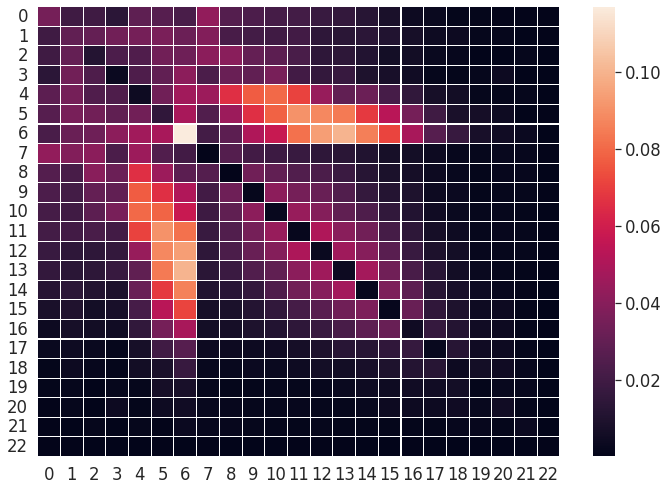

In [ ]:
import seaborn as sns;
sns.set_theme()
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set(font_scale=1.5)

cx = sns.heatmap(reconstruction_loss_matrix_c, linewidths=.1)

###Clustering dataset C

First of all, a dimension of the dataset is removed:

In [ ]:
data_c_X = np.squeeze(data_c)

Then we compute eigenvalues:

In [ ]:
_, eigvals_c, _ = np.linalg.svd(data_c_X)

Then we do and visualize clustering using HDBScan:

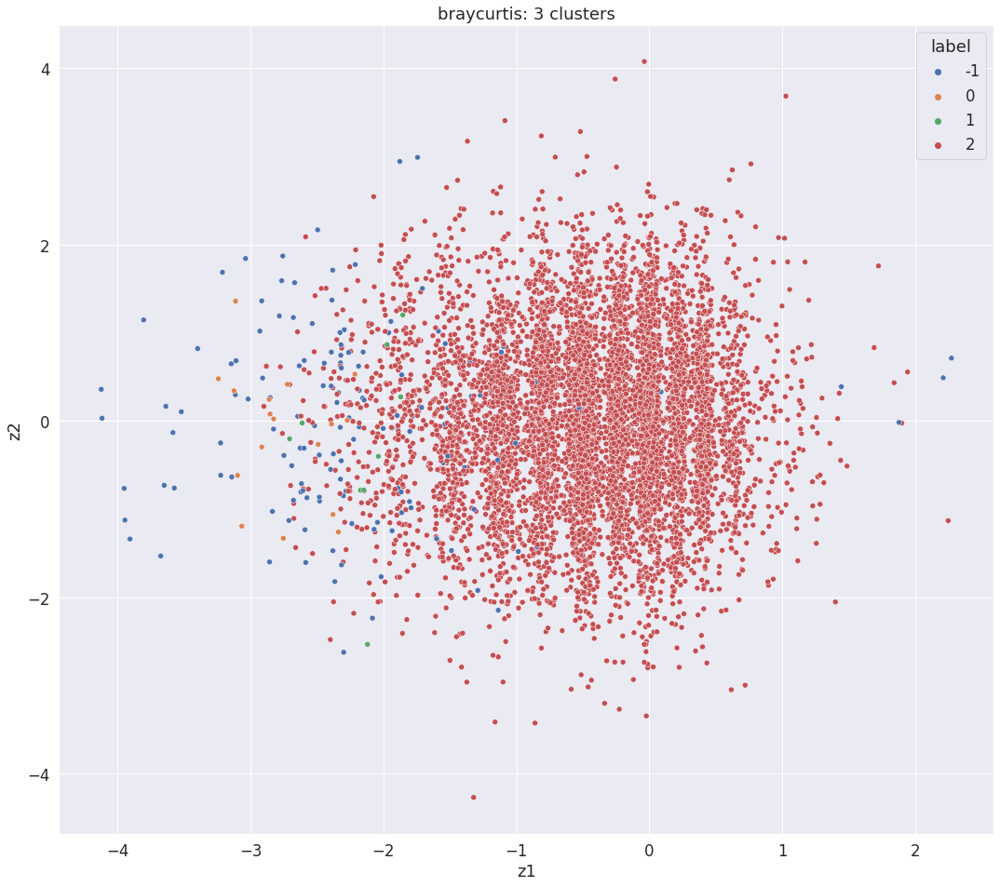

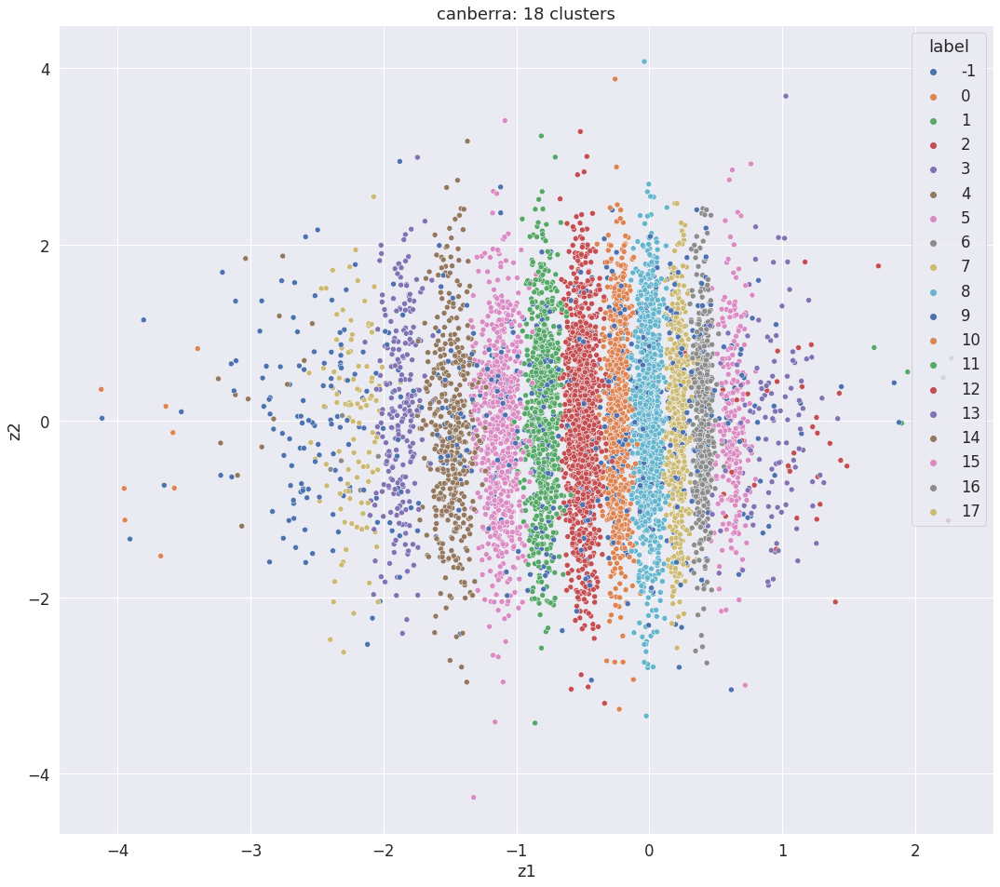

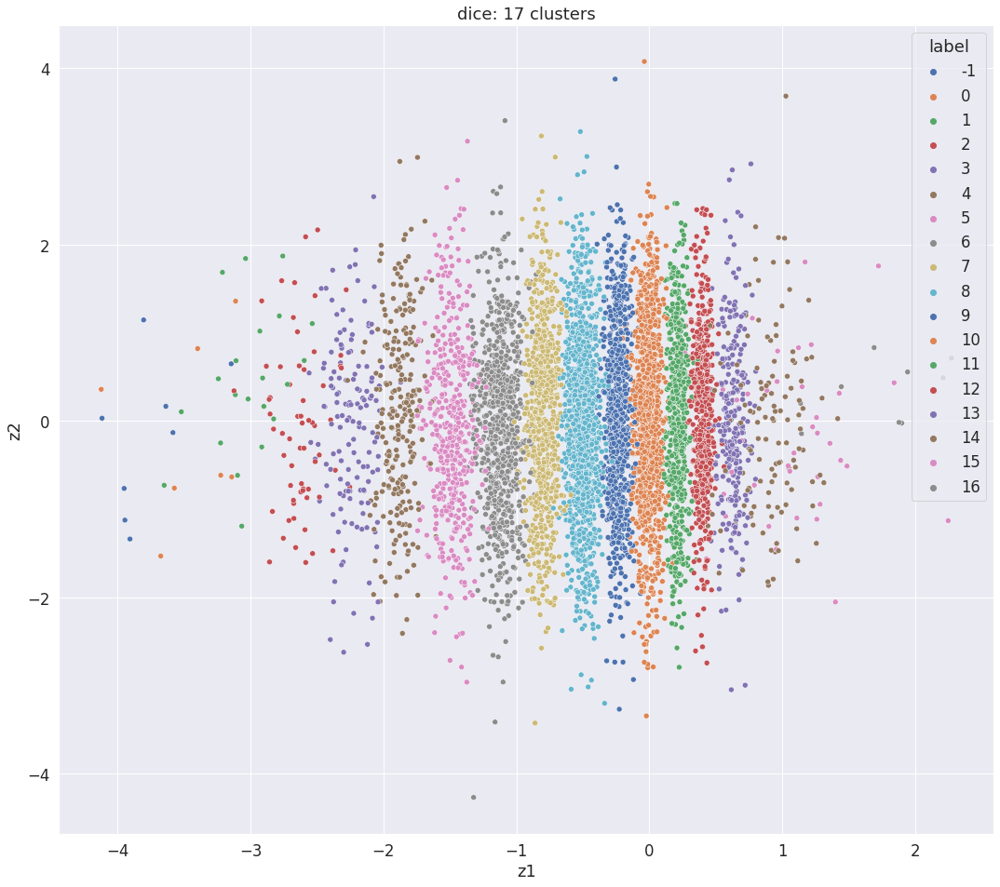

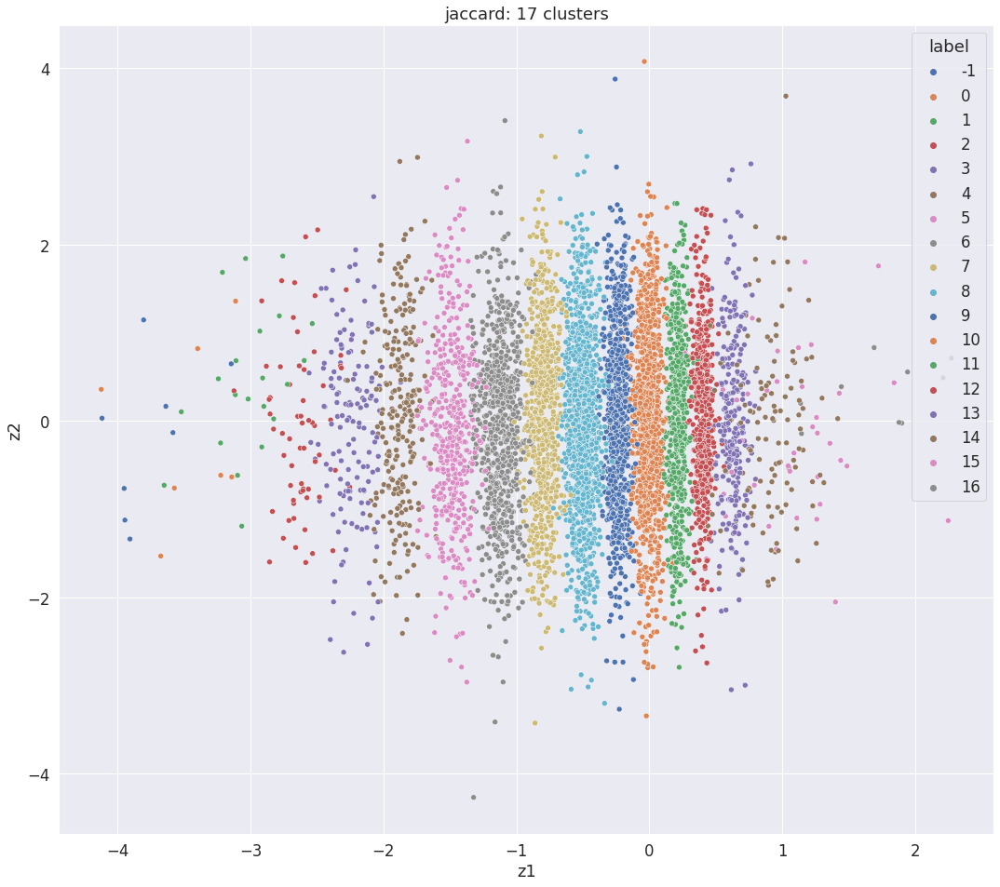

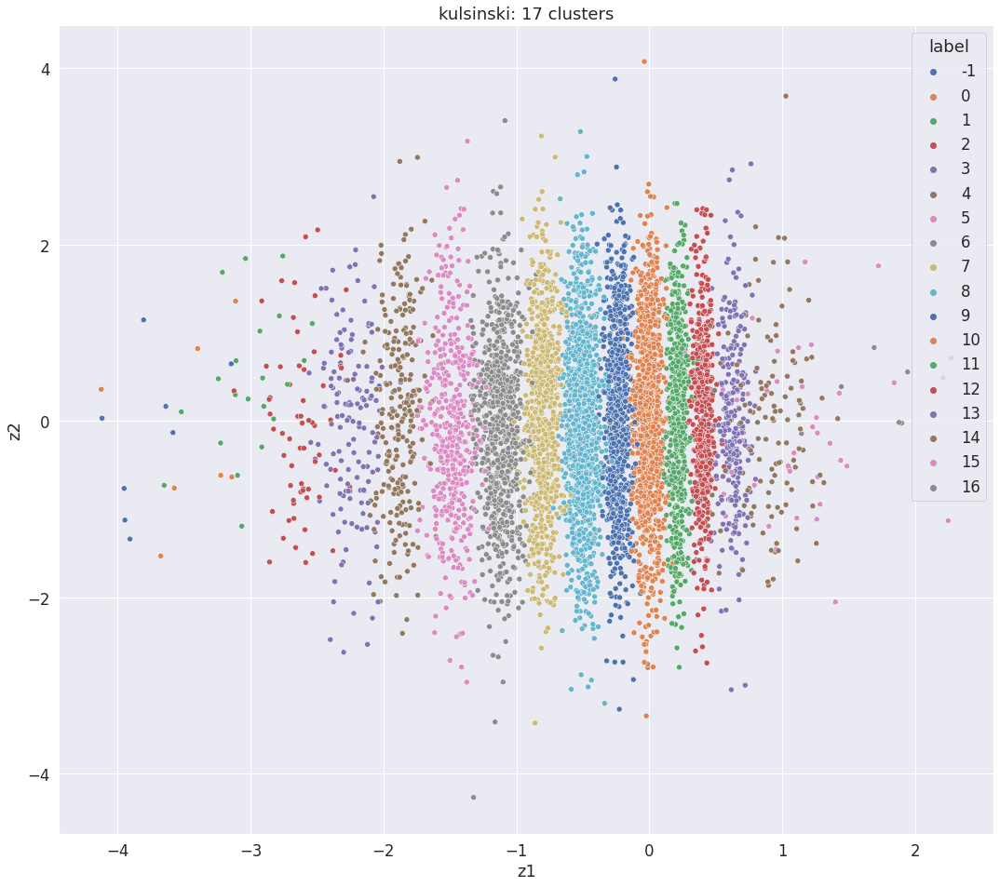

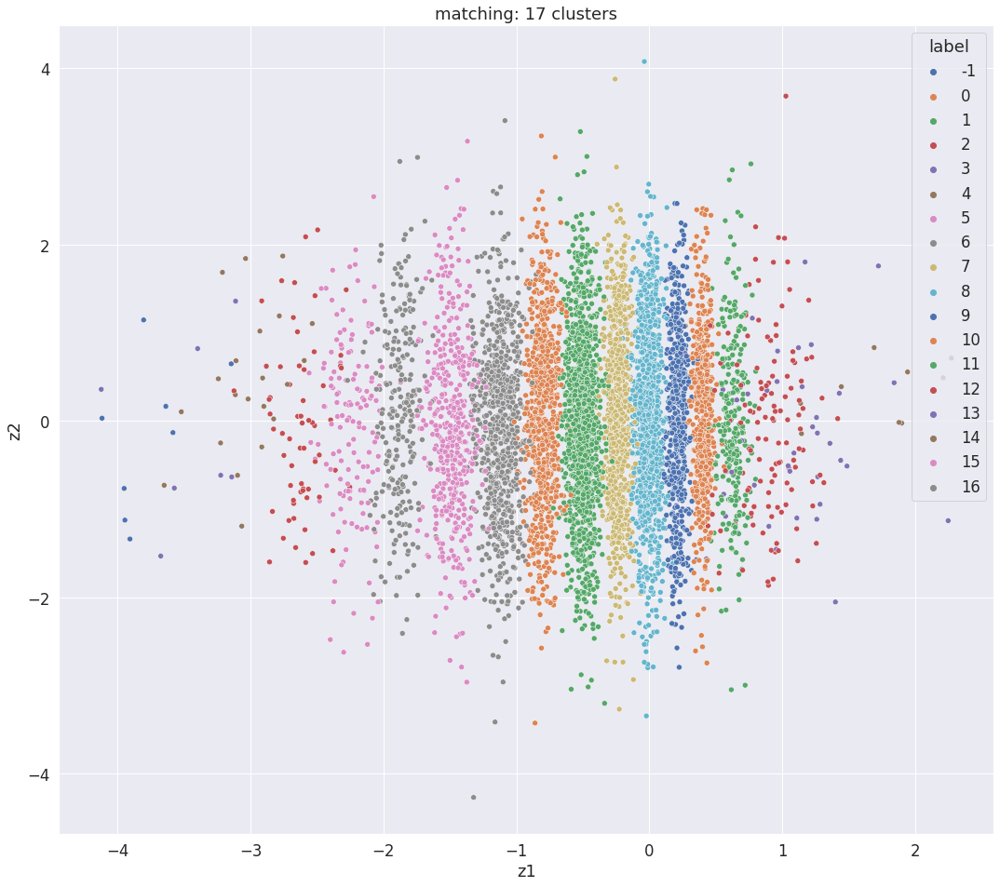

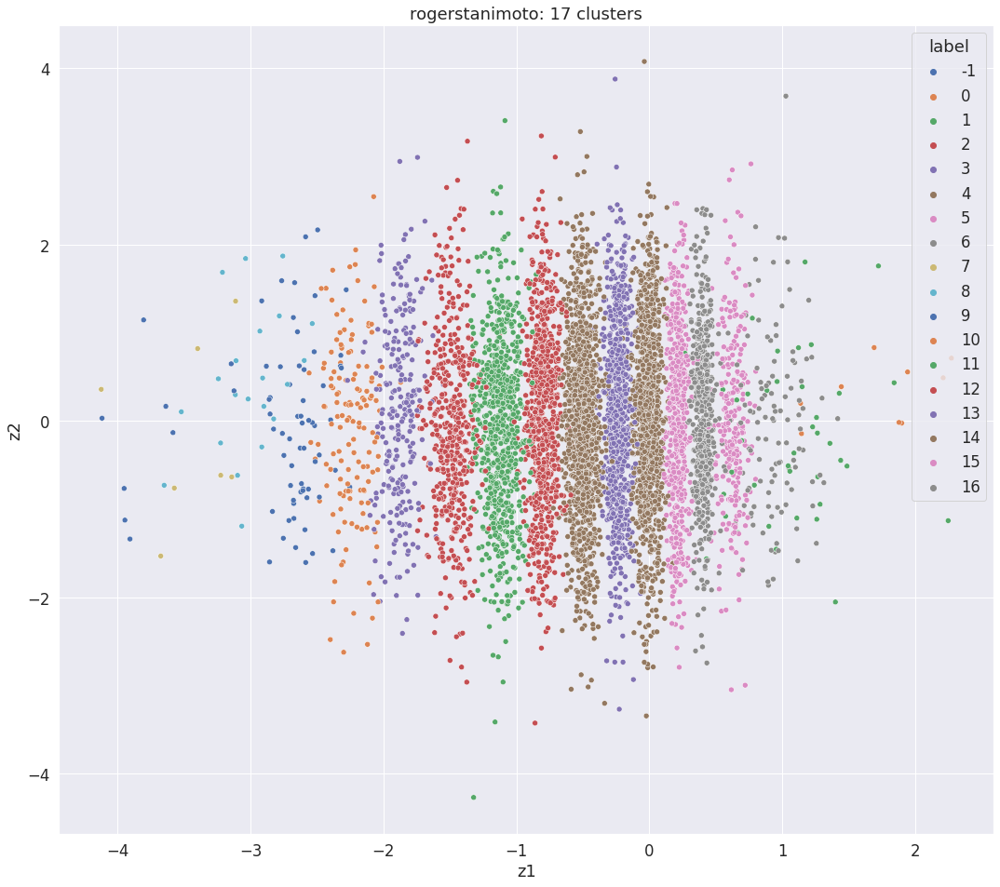

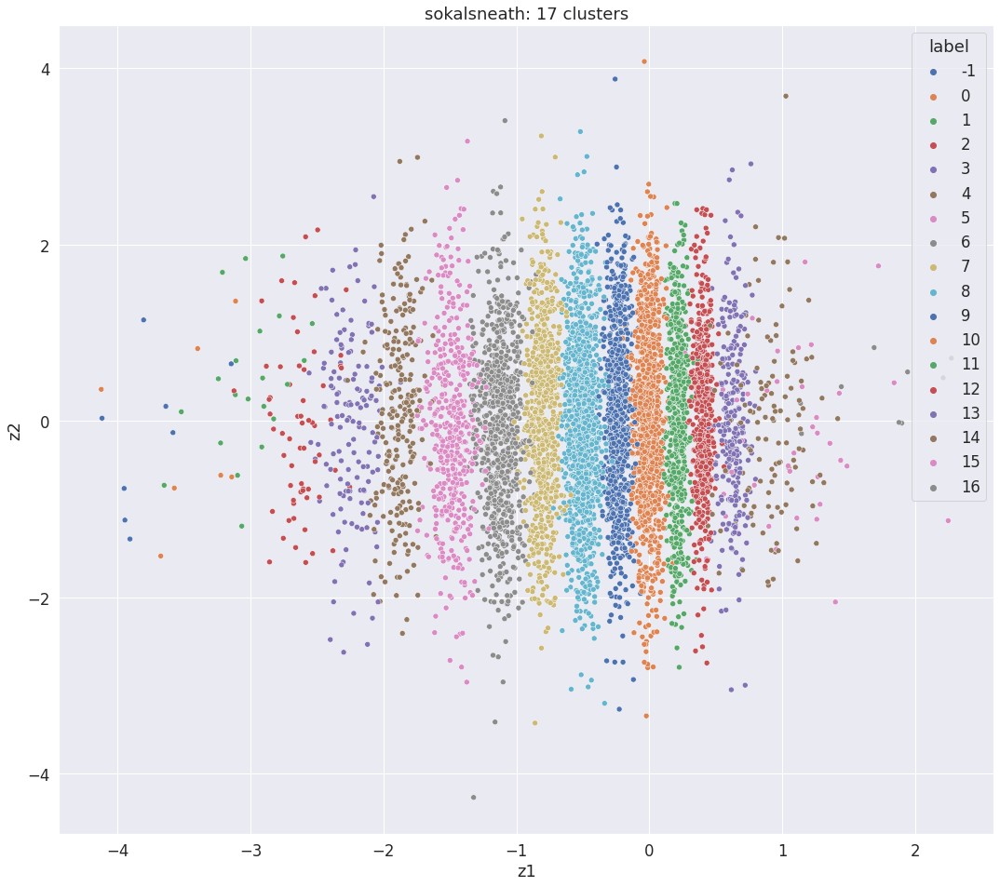

In [ ]:
z1 = []
z2 = []

_, _, latent_c = vae_c.encoder(data_c)

for i in range(data_c.shape[0]):    
    z1.append(latent_c.numpy()[i][0])
    z2.append(latent_c.numpy()[i][1])

df_c = pd.DataFrame()
df_c['z1'] = z1
df_c['z2'] = z2

outliers_c = dict()

for metric in metrics:
  clusterer = clusterData(metric, eigvals_c)
  df_c['label'] = clusterer.labels_
  outliers_c.update({metric: len(df_c[df_c.label==-1])})
  plt.figure(figsize=(18, 16))
  sns.scatterplot(x='z1', y='z2', hue='label', data=df_c, palette='deep')
  plt.title(metric+": "+str(clusterer.labels_.max()+1)+" clusters")
  plt.show()


Then, we can evaluate how many different outliers are generated using different metrics to generate clusters:

In [ ]:
print(outliers_c)

{'braycurtis': 146, 'canberra': 695, 'dice': 8, 'jaccard': 8, 'kulsinski': 8, 'matching': 8, 'rogerstanimoto': 8, 'sokalsneath': 8}


###Explainability of the model

One more step regards the identification of the molecules of the dataset in terms of their chemical formula. A way to achieve this goal is using .xyz files of the qm7 and qm7b datasets which contain the description of each single molecule.

First, we define the path of .xyz file describing qm7 dataset:

In [ ]:
qm7_xyz = '/content/drive/MyDrive/Thesis Research/dsgdb7ae.xyz'

Then, the path of .xyz file describing qm7b dataset:

In [ ]:
qm7b_xyz = '/content/drive/MyDrive/Thesis Research/dsgdb7njp.xyz'

A function $datasetNaming$ is defined to get a Numpy array of the names of each molecule of the provided dataset through the parameter $path$:

In [ ]:
def datasetNaming(path):
  with open(path, 'r') as file:
      line = True
      molecules = list()
      energies = list()
      T = True
      while line:
        line = file.readline()
        try:        
          n_atoms = int(line)       
          atoms = list()        
          T = False
        except(ValueError):
          if T == False:
            T = True
            energies.append(float(line.partition(" ")[0]))          
            continue
          else:
            if(len(line)!=0 and line != '\n'):
              atoms.append(line[0])
              if(n_atoms == len(atoms)):
                for count in range(0, 23-n_atoms):
                  atoms.append("")         
                molecules.append(atoms)

  molecules=np.array([np.array(molecule) for molecule in molecules], dtype = 'object')
  energies=np.array(energies)
  return molecules, energies


Then, we get the array with the names and atomization energies of qm7 and qm7b:

In [ ]:
qm7_names, qm7_energies = datasetNaming(qm7_xyz)

In [ ]:
qm7b_names, qm7b_energies = datasetNaming(qm7b_xyz)

A further validation step is needed to ensure the correspondance between the original qm7/qm7b dataset and the .xyz one, the comparison is done on atomization energy values:

In [ ]:
print(qm7['T'])
print(qm7_energies)

[[ -417.96  -712.42  -564.21 ... -1662.1  -1782.01 -1919.  ]]
[ -417.96  -712.42  -564.21 ... -1662.1  -1782.01 -1919.  ]


In [ ]:
print(qm7b['T'][:,0])
print(qm7b_energies)

[ -420.93374634  -718.41918945  -570.02484131 ... -1330.14880371
 -1355.4855957  -1494.44995117]
[ -420.9337343   -718.41917869  -570.0248559  ... -1330.14884528
 -1355.48559716 -1494.4499951 ]


Now, the obtained datasets can be used to know the name of a single molecules of index *i*:

In [ ]:
print(qm7_names[0], "is described by the following properties", data_a_unnorm[0])

['C' 'H' 'H' 'H' 'H' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' ''] is described by the following properties [[[ 3.6858105e+01]
  [ 2.9076326e+00]
  [ 2.9076121e+00]
  [ 2.9075644e+00]
  [ 2.9053485e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 6.0000000e+00]
  [ 1.8864380e+00]
  [-4.6487264e-03]
  [-8.2392059e-03]
  [-4.1795999e+02]]

 [[ 2.9076326e+00]
  [ 5.0000000e-01]
  [ 2.9672000e-01]
  [ 2.9671896e-01]
  [ 2.9667839e-01]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 0.0

In [ ]:
print(qm7b_names[0], "is described by the following properties", data_b_unnorm[0])

['C' 'H' 'H' 'H' 'H' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' ''] is described by the following properties [[[ 3.68581047e+01]
  [ 2.89612317e+00]
  [ 2.89613891e+00]
  [ 2.89608264e+00]
  [ 2.89612389e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.20933746e+02]
  [ 3.96946262e+01]
  [ 6.21841405e-01]
  [-1.60130000e+01]
  [ 4.16200000e+00]
  [ 3.67680731e+01]
  [ 1.57252300e+01]
  [-3.98613000e+00]
  [-1.09488000e+01]
  [ 1.32300000e-01]
  [-1.41341000e+01]
  [ 1.08700000e+00]
  [ 2.53457600e+00]
  [ 2.43222000e+00]]

 [[ 2.89612317e+00]
  [ 5.00000000e-01]
  [ 2.95579880e-01]
  [ 2.95587122e-01]
  [ 2.95581907e-01]
  [ 0.00000000e+00]
  [ 0.00000000e+00]
 

One more step can be done to merge the complete dataset with the set of molecules formulas:

In [ ]:
dataset_a = np.concatenate ((np.expand_dims(qm7_names, 2), qm7['X'], np.expand_dims(qm7['Z'], 2), qm7['R'], np.tile(qm7['T'].T, (23)).reshape(7165,23,1)), axis=2)

In [ ]:
dataset_b = np.concatenate ((np.expand_dims(qm7b_names, 2), qm7b['X'], np.tile(qm7b['T'], (23)).reshape(7211,23,14)), axis=2)

Let's try to visualize an example, the name of the atom for each molecule is at comlumn 0:

In [ ]:
pd.DataFrame(dataset_a[0])

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,C,36.858105,2.907633,2.907612,2.907564,2.905349,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,6.0,1.886438,-0.004649,-0.008239,-417.959991
1,H,2.907633,0.5,0.29672,0.296719,0.296678,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,3.949924,-0.004592,0.007823,-417.959991
2,H,2.907612,0.29672,0.5,0.296718,0.296678,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.19769,1.940484,0.007823,-417.959991
3,H,2.907564,0.296719,0.296718,0.5,0.296677,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.184934,-0.997265,1.659387,-417.959991
4,H,2.905349,0.296678,0.296678,0.296677,0.5,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.211995,-0.958979,-1.710958,-417.959991
5,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-417.959991
6,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-417.959991
7,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-417.959991
8,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-417.959991
9,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-417.959991


In [ ]:
pd.DataFrame(dataset_b[0])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37
0,C,36.858105,2.896123,2.896139,2.896083,2.896124,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-420.933746,39.694626,0.621841,-16.013,4.162,36.768073,15.72523,-3.98613,-10.9488,0.1323,-14.1341,1.087,2.534576,2.43222
1,H,2.896123,0.5,0.29558,0.295587,0.295582,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-420.933746,39.694626,0.621841,-16.013,4.162,36.768073,15.72523,-3.98613,-10.9488,0.1323,-14.1341,1.087,2.534576,2.43222
2,H,2.896139,0.29558,0.5,0.295586,0.29558,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-420.933746,39.694626,0.621841,-16.013,4.162,36.768073,15.72523,-3.98613,-10.9488,0.1323,-14.1341,1.087,2.534576,2.43222
3,H,2.896083,0.295587,0.295586,0.5,0.295587,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-420.933746,39.694626,0.621841,-16.013,4.162,36.768073,15.72523,-3.98613,-10.9488,0.1323,-14.1341,1.087,2.534576,2.43222
4,H,2.896124,0.295582,0.29558,0.295587,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-420.933746,39.694626,0.621841,-16.013,4.162,36.768073,15.72523,-3.98613,-10.9488,0.1323,-14.1341,1.087,2.534576,2.43222
5,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-420.933746,39.694626,0.621841,-16.013,4.162,36.768073,15.72523,-3.98613,-10.9488,0.1323,-14.1341,1.087,2.534576,2.43222
6,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-420.933746,39.694626,0.621841,-16.013,4.162,36.768073,15.72523,-3.98613,-10.9488,0.1323,-14.1341,1.087,2.534576,2.43222
7,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-420.933746,39.694626,0.621841,-16.013,4.162,36.768073,15.72523,-3.98613,-10.9488,0.1323,-14.1341,1.087,2.534576,2.43222
8,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-420.933746,39.694626,0.621841,-16.013,4.162,36.768073,15.72523,-3.98613,-10.9488,0.1323,-14.1341,1.087,2.534576,2.43222
9,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-420.933746,39.694626,0.621841,-16.013,4.162,36.768073,15.72523,-3.98613,-10.9488,0.1323,-14.1341,1.087,2.534576,2.43222


###Reconstruction performances evaluation

A problem to investigate is whether the reconstruction of molecules performed by the model is correct or not. A way to discover it is to compute the Euclidean norm distances between the Coulomb matrices representations of the molecules. In particular, first the distribution of the pairwise distances is computed, then for a given generated molecule the same distance is computed wrt the original molecule. A good reconstruction should give a much smaller distance compared to the distributions' distances.

First of all, let's try to compute all the possible distances between each molecule:

In [ ]:
from tqdm import tqdm

In [ ]:
distances = list()

for i in tqdm(range(0, eigvals_c.shape[0])):  
  for j in range(i+1, eigvals_c.shape[0]):
    distances.append(np.linalg.norm(eigvals_c[i]-eigvals_c[j]))

100%|██████████| 7165/7165 [02:58<00:00, 40.07it/s] 


In [ ]:
rounded_distances = [round(num, 2) for num in distances]

Then, we visualize them as a chart:

In [ ]:
import collections
frequency = collections.Counter(rounded_distances)

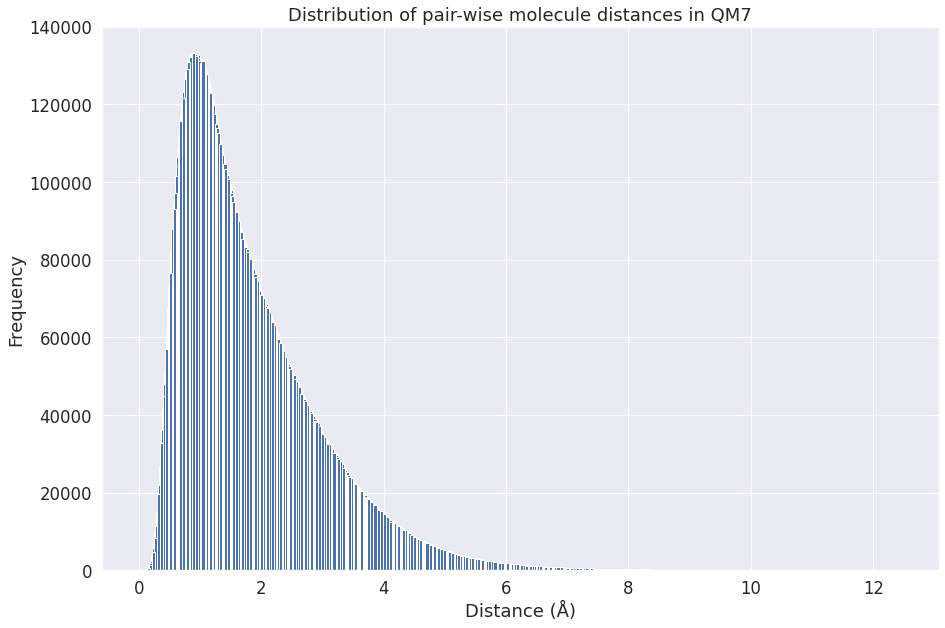

In [ ]:
labels, values = zip(*frequency.items())

width = 0.05
plt.figure(figsize=(15, 10))
bar = plt.bar(labels, values, width)
plt.xlabel("Distance (Å)")
plt.ylabel("Frequency")
plt.title("Distribution of pair-wise molecule distances in QM7")
plt.savefig('distribution-distances-qm7.png')
plt.show()

Then a computation of some statistics on distances between molecules on **original dataset** is performed:

In [ ]:
print("Mean distance: ", np.mean(distances))
print("Variance of the distance: ", np.var(distances))
print("Max distance: ", np.max(distances))
print("Min distance: ", np.min(distances))

Mean distance:  1.8353218
Variance of the distance:  1.3313185
Max distance:  12.418265
Min distance:  0.042080846


We compute the same information also for QM7b dataset:

100%|██████████| 7211/7211 [03:06<00:00, 38.60it/s] 


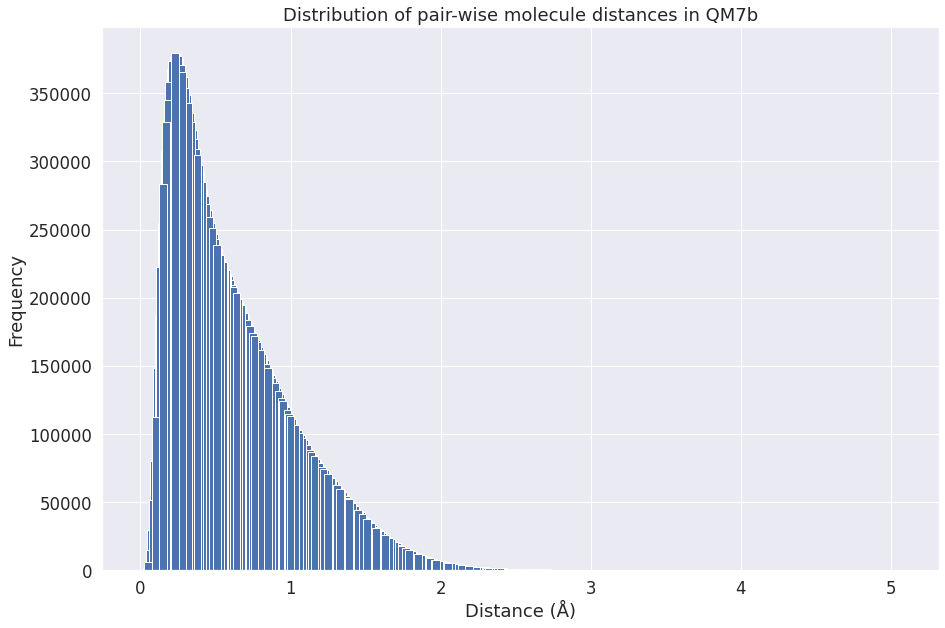

In [ ]:
distances = list()

for i in tqdm(range(0, eigvals_b.shape[0])):  
  for j in range(i+1, eigvals_b.shape[0]):
    distances.append(np.linalg.norm(eigvals_b[i]-eigvals_b[j]))

rounded_distances = [round(num, 2) for num in distances]
frequency = collections.Counter(rounded_distances)
labels, values = zip(*frequency.items())

width = 0.05
plt.figure(figsize=(15, 10))
bar = plt.bar(labels, values, width)
plt.xlabel("Distance (Å)")
plt.ylabel("Frequency")
plt.title("Distribution of pair-wise molecule distances in QM7b")
plt.savefig('distribution-distances-qm7b.png')
plt.show()

In [ ]:
print("Mean distance: ", np.mean(distances))
print("Variance of the distance: ", np.var(distances))
print("Max distance: ", np.max(distances))
print("Min distance: ", np.min(distances))

Mean distance:  0.6293053530864122
Variance of the distance:  0.18168981693639852
Max distance:  5.0438103402240415
Min distance:  0.017261677097830202


--------------------------------------------------------------------------------

###Dataset A

In [ ]:
_, _, z_a = vae_a.encoder(data_a)
reconstruction_a = vae_a.decoder(z_a)
reconstruction_a = reconstruction_a.numpy()
reconstruction_a = np.squeeze(reconstruction_a)
_, eigvals_reconstruction_a, _ = np.linalg.svd(reconstruction_a[:, :, :23])

In [ ]:
#additional  computation on data_a(2)
reconstruction_norm = np.array([np.linalg.norm(eigvals[i]-eigvals_reconstruction_a[i]) for i in range(0, data_a.shape[0])])

In [ ]:
#additional  computation on data_a(3)
print("Mean distance: ", np.mean(reconstruction_norm))
print("Variance of the distance: ", np.var(reconstruction_norm))
print("Max distance: ", np.max(reconstruction_norm))
print("Min distance: ", np.min(reconstruction_norm))

Mean distance:  1.6500146
Variance of the distance:  0.1990275
Max distance:  3.362786
Min distance:  0.21624534


--------------------------------------------------------------------------------

###Dataset B

In [ ]:
#additional * computation on data_b
_, _, z_b = vae_b.encoder(data_b)
reconstruction_b = vae_b.decoder(z_b)
reconstruction_b = reconstruction_b.numpy()
reconstruction_b = np.squeeze(reconstruction_b)
_, eigvals_reconstruction_b, _ = np.linalg.svd(reconstruction_b[:, :23])

In [ ]:
#additional * computation on data_b(2)
reconstruction_norm_b = np.array([np.linalg.norm(eigvals_b[i]-eigvals_reconstruction_b[i]) for i in range(0, data_b.shape[0])])

In [ ]:
#additional  computation on data_b(3)
print("Mean distance: ", np.mean(reconstruction_norm_b))
print("Variance of the distance: ", np.var(reconstruction_norm_b))
print("Max distance: ", np.max(reconstruction_norm_b))
print("Min distance: ", np.min(reconstruction_norm_b))

Mean distance:  7.969834008437417
Variance of the distance:  0.40329248668800133
Max distance:  11.383945791939713
Min distance:  4.867684054041239


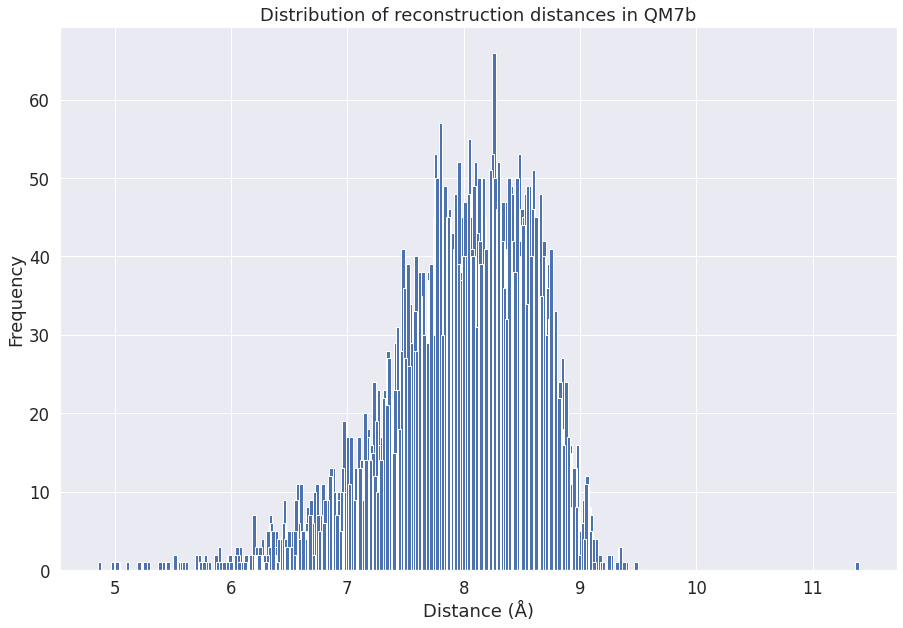

In [ ]:
rounded_distances = [round(num, 2) for num in reconstruction_norm_b]
frequency = collections.Counter(rounded_distances)
labels, values = zip(*frequency.items())

width = 0.03
plt.figure(figsize=(15, 10))
bar = plt.bar(labels, values, width)
plt.xlabel("Distance (Å)")
plt.ylabel("Frequency")
plt.title("Distribution of reconstruction distances in QM7b")
plt.savefig('reconstruction-distances-qm7b.png')
plt.show()

--------------------------------------------------------------------------------

###Dataset C

In [ ]:
_, _, z_c = vae_c.encoder(data_c)
reconstruction_c = vae_c.decoder(z_c)
reconstruction_c = reconstruction_c.numpy()
reconstruction_c = np.squeeze(reconstruction_c)
_, eigvals_reconstruction_c, _ = np.linalg.svd(reconstruction_c)

In [ ]:
reconstruction_norm_c = np.array([np.linalg.norm(eigvals_c[i]-eigvals_reconstruction_c[i]) for i in range(0, data_c.shape[0])])

In [ ]:
print("Mean distance: ", np.mean(reconstruction_norm_c))
print("Variance of the distance: ", np.var(reconstruction_norm_c))
print("Max distance: ", np.max(reconstruction_norm_c))
print("Min distance: ", np.min(reconstruction_norm_c))

Mean distance:  1.6754088
Variance of the distance:  0.21310577
Max distance:  4.768749
Min distance:  0.14331716


**What about this value? Is it small wrt the distribution of distances of other molecules?**

Another way to better evaluate the quality of reconstruction of the model is through **dRMSD** also known as *distance Root-Mean Square Deviation*. This value is computed between the original molecule coordinates and reconstructed molecule coordinates, for each of the possible distances between atoms in a molecule. First let's take into consideration the set of data containing cartesian coordinates into $qm7$ dataset:

In [ ]:
original_coordinates = qm7['R']

Then we consider the set of reconstructed cartesian coordinates:

In [ ]:
_, _, z_a = vae_a.encoder(data_a)
reconstruction_a = vae_a.decoder(z_a)

In [ ]:
reconstruction_a = reconstruction_a.numpy()

In [ ]:
reconstruction_a_unnorm = reconstruction_a * (data_a_unnorm.max(axis=0) - data_a_unnorm.min(axis=0)) + data_a_unnorm.min(axis=0)

In [ ]:
reconstructed_coordinates = np.squeeze(reconstruction_a_unnorm)[:, :, 24:27]

The next step is the computation of  
${dRMSD}=\sqrt{\frac{1}{N\cdot(N+1)}\sum_{i<j}(p_{ij}-q_{ij})^2}$

In [ ]:
def count_atoms(index, dataset_names):
  number_atoms = 0
  for atom in dataset_names[index]:
    if atom != '':
      number_atoms += 1
    else:
      break
  return number_atoms

In [ ]:
import math

In [ ]:
#rmsd_values = list()
#for i in range(0, reconstructed_coordinates.shape[0]):
  #n = count_atoms(i, qm7_names)
  #rmsd_values.append(math.sqrt(np.sum((reconstructed_coordinates[i][0:n] - original_coordinates[i][0:n])**2)/n))  #we take just the first n values of the array => the atoms (different than zero)
#rmsd_values = np.array(rmsd_values)

In [ ]:
#Caroline's version
#rmsd_values = list()
#for i in range(0, reconstructed_coordinates.shape[0]):  #let's iterate for each molecule
  #n = count_atoms(i, qm7_names)
  #sum = 0
  #for j in range (0,n):
    #sum += (np.sum((reconstructed_coordinates[i][j] - original_coordinates[i][j])**2)/3)
    #rmsd_values.append(math.sqrt(np.sum((reconstructed_coordinates[i][j] - original_coordinates[i][j])**2)/3))  #we take just the first n values of the array => the atoms (different than zero)
  #rmsd_values.append(math.sqrt(sum/n))
#rmsd_values = np.array(rmsd_values)

In [ ]:
'''#new version through dRMSD
drmsd_values = list()
for m in range(0, reconstructed_coordinates.shape[0]):  #molecules iteration
  n = count_atoms(m, qm7_names)
  sum = 0
  for i in range(0, n): 
    for j in range(i+1, n):
      sum += np.sum(((reconstructed_coordinates[m][i] - reconstructed_coordinates[m][j]) - (original_coordinates[m][i] - original_coordinates[m][j]))**2)/3
  drmsd = math.sqrt(sum/(n*(n+1)))
  drmsd_values.append(drmsd)'''
  

'#new version through dRMSD\ndrmsd_values = list()\nfor m in range(0, reconstructed_coordinates.shape[0]):  #molecules iteration\n  n = count_atoms(m, qm7_names)\n  sum = 0\n  for i in range(0, n): \n    for j in range(i+1, n):\n      sum += np.sum(((reconstructed_coordinates[m][i] - reconstructed_coordinates[m][j]) - (original_coordinates[m][i] - original_coordinates[m][j]))**2)/3\n  drmsd = math.sqrt(sum/(n*(n+1)))\n  drmsd_values.append(drmsd)'

In [ ]:
#new version through dRMSD
drmsd_values = list()
for m in range(0, reconstructed_coordinates.shape[0]):  #molecules iteration
  n = count_atoms(m, qm7_names)
  sum = 0
  for i in range(0, n): 
    for j in range(0, n):
      v= math.sqrt(np.sum(((reconstructed_coordinates[m][i] - reconstructed_coordinates[m][j]) - (original_coordinates[m][i] - original_coordinates[m][j]))**2))
      sum+=v
  drmsd = math.sqrt(sum/(n*(n-1)))
  drmsd_values.append(drmsd)


The set of **dRMSD** values is placed into a numpy array whose statistics are:

In [ ]:
print("Max dRMSD:", str(np.max(drmsd_values)))
print("Min dRMSD:", str(np.min(drmsd_values)))
print("Mean dRMSD:", str(np.mean(drmsd_values)))

Max dRMSD: 3.184074976808825
Min dRMSD: 1.850654163660526
Mean dRMSD: 2.1970446714967298


--------------------------------------------------------------------------------

###Additional scripts

One more script is executed on dataset a to compute the molecule with the highest number of atoms on *data_a*:

In [ ]:
idx_max_a = -1
count_max_a = 0
for i in range(0, 2000): #only on the first 2000 molecules
  count = 0
  for j in range(0, 23):
    if pd.DataFrame(dataset_a[i])[0][j] != "":
      count+=1
  if count > count_max_a:
    count_max_a = count
    idx_max_a = i

The molecule's name is $C_6NH_{15}$ *Triethylamine*:

In [ ]:
pd.DataFrame(dataset_a[idx_max_a])[0]

0     C
1     C
2     C
3     C
4     C
5     C
6     N
7     H
8     H
9     H
10    H
11    H
12    H
13    H
14    H
15    H
16    H
17    H
18    H
19    H
20    H
21    H
22     
Name: 0, dtype: object

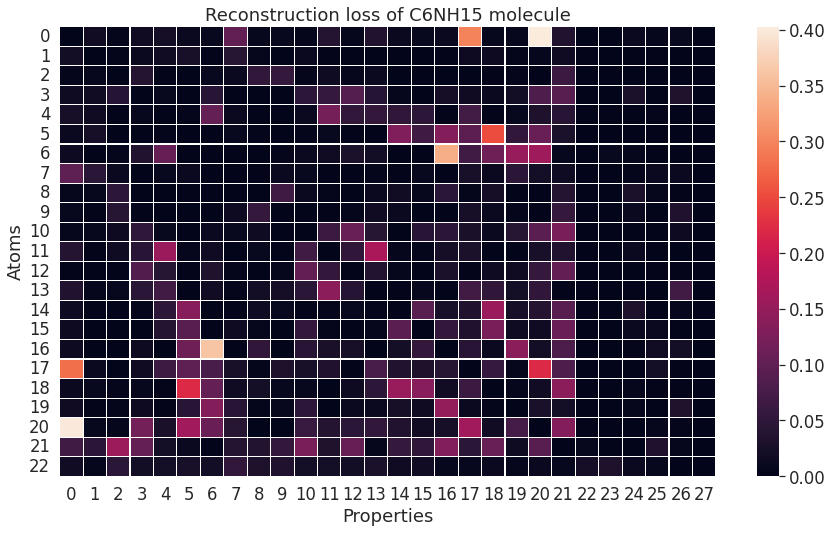

In [ ]:
sample_a = data_a[idx_max_a]
sample_a = sample_a[np.newaxis, :]

_, _, z_a = vae_a.encoder(sample_a)
reconstruction_a = vae_a.decoder(z_a)

reconstruction_loss_a = tf.squeeze(tf.math.square(sample_a - reconstruction_a))

sns.set_theme()
sns.set(rc={'figure.figsize':(14.7,8.27)})
sns.set(font_scale=1.5)

cx = sns.heatmap(reconstruction_loss_a, linewidths=.1)
cx.set(xlabel='Properties', ylabel='Atoms')
cx.set(title='Reconstruction loss of C6NH15 molecule')
cx.figure.savefig("c6nh15-qm7-reconstruction-loss.png")

The same task is executed to compute the molecule with the highest number of atoms on *data_b*:

In [ ]:
idx_max_b = -1
count_max_b = 0
for i in range(0, 2000): #only on the first 2000 molecules
  count = 0
  for j in range(0, 23):
    if pd.DataFrame(dataset_b[i])[0][j] != "":
      count+=1
  if count > count_max_b:
    count_max_b = count
    idx_max_b = i

The molecule's name is $C_7H_{16}$ *Heptane*:

In [ ]:
pd.DataFrame(dataset_b[idx_max_b])[0]

0     C
1     C
2     C
3     C
4     C
5     C
6     C
7     H
8     H
9     H
10    H
11    H
12    H
13    H
14    H
15    H
16    H
17    H
18    H
19    H
20    H
21    H
22    H
Name: 0, dtype: object

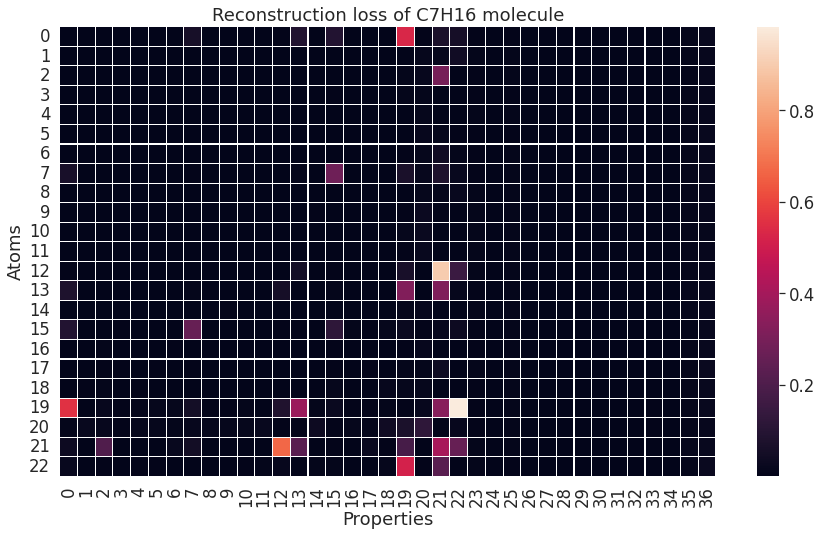

In [ ]:
sample_b = data_b[idx_max_b]
sample_b = sample_b[np.newaxis, :]

_, _, z_b = vae_b.encoder(sample_b)
reconstruction_b = vae_b.decoder(z_b)

reconstruction_loss_b = tf.squeeze(tf.math.square(sample_b - reconstruction_b))

sns.set_theme()
sns.set(rc={'figure.figsize':(14.7,8.27)})
sns.set(font_scale=1.5)

dx = sns.heatmap(reconstruction_loss_b, linewidths=.1)
dx.set(xlabel='Properties', ylabel='Atoms')
dx.set(title='Reconstruction loss of C7H16 molecule')
dx.figure.savefig("c7h16-qm7b-reconstruction-loss.png")